
  ╭─SynopticPy:HELP────────────────────────────────────────────────────────╮
  │                                                                        │
  │ A valid Synoptic token is required to use SynopticPy.                  │
  │                                                                        │
  │ You can sign up for an open-access account or view your account at     │
  │ https://customer.synopticdata.com/                                     │
  │                                                                        │
  ├┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┄┤
  │                                                                        │
  │ To use your token with SynopticPy, do one of the following:            │
  │                                                                        │
  │  1) Set the environment variable SYNOPTIC_TOKEN with your token.       │
  │                                                                        

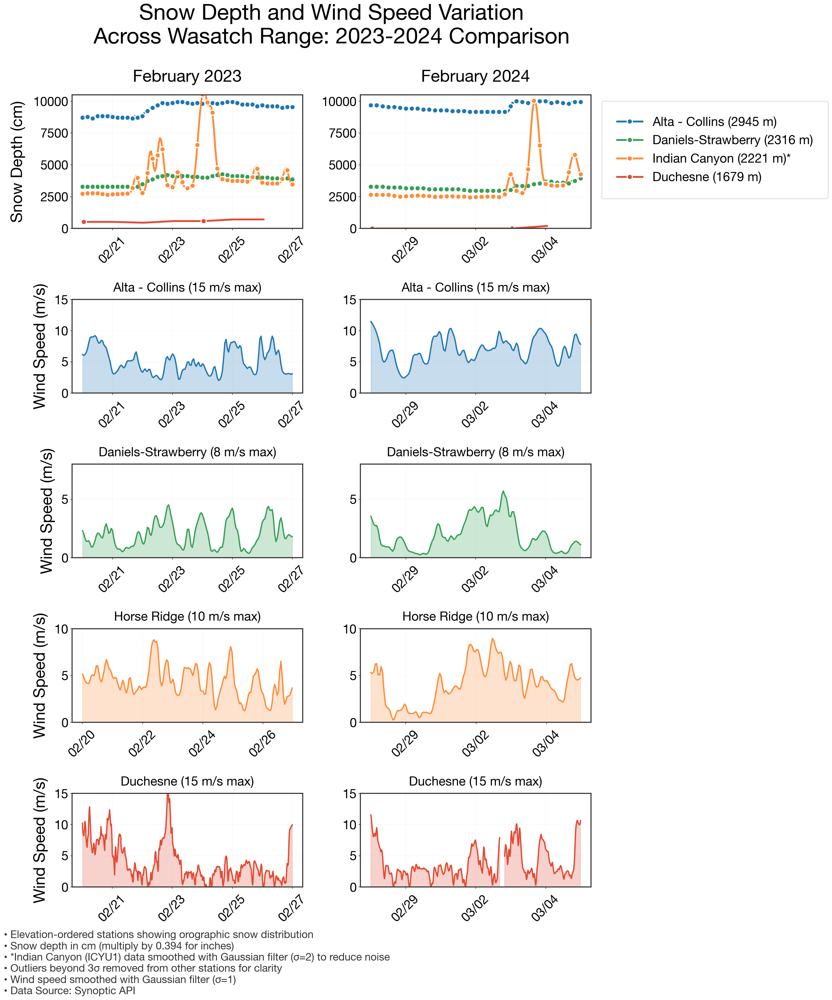

In [1]:
from datetime import datetime
from synoptic import TimeSeries
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.ndimage import gaussian_filter1d
import matplotlib.dates as mdates

# Enhanced font and style configurations optimized for poster presentation
plt.style.use('default')
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Helvetica Neue', 'Helvetica', 'Arial']
rcParams['font.size'] = 28  # Base font size increased
rcParams['axes.titlesize'] = 32
rcParams['axes.labelsize'] = 30
rcParams['xtick.labelsize'] = 24
rcParams['ytick.labelsize'] = 24
rcParams['legend.fontsize'] = 24
rcParams['axes.linewidth'] = 2.5
rcParams['axes.edgecolor'] = '#333333'

# Token and time periods
token = 'YOUR_API_TOKEN'
periods = [
    {
        'start': datetime(2023, 2, 20),
        'end': datetime(2023, 2, 27),
        'title': '2023'
    },
    {
        'start': datetime(2024, 2, 28),
        'end': datetime(2024, 3, 5),
        'title': '2024'
    }
]

# Station information with enhanced color palette for better distinction
snow_stations = {
    'CLN': {'name': 'Alta - Collins (2945 m)', 'color': '#2077B4'},
    'DSTU1': {'name': 'Daniels-Strawberry (2316 m)', 'color': '#37A055'},
    'ICYU1': {'name': 'Indian Canyon (2221 m)', 'color': '#FF8C38'},
    'COOPDSNU1': {'name': 'Duchesne (1679 m)', 'color': '#E34A33'}
}

# Corresponding wind stations with adjusted max wind values
wind_stations = {
    'ALT': {'name': 'Alta - Collins', 'color': '#2077B4', 'max_wind': 15},
    'DSTU1': {'name': 'Daniels-Strawberry', 'color': '#37A055', 'max_wind': 8},
    'HSRU1': {'name': 'Horse Ridge', 'color': '#FF8C38', 'max_wind': 10},
    'KU69': {'name': 'Duchesne', 'color': '#E34A33', 'max_wind': 15}
}

try:
    # Create figure with optimized dimensions
    fig = plt.figure(figsize=(18, 24), facecolor='white', dpi=150)
    gs = plt.GridSpec(5, 2, height_ratios=[1, 0.7, 0.7, 0.7, 0.7], hspace=0.7, wspace=0.25)

    # Create subplots
    ax_snow1 = fig.add_subplot(gs[0, 0])
    ax_snow2 = fig.add_subplot(gs[0, 1])

    # Create wind subplots
    ax_winds_2023 = [fig.add_subplot(gs[i+1, 0]) for i in range(4)]
    ax_winds_2024 = [fig.add_subplot(gs[i+1, 1]) for i in range(4)]

    # Process each time period
    for idx, period in enumerate(periods):
        ax_snow = ax_snow1 if idx == 0 else ax_snow2

        # Fetch data
        df_snow = TimeSeries(
            token=token,
            stid=list(snow_stations.keys()),
            vars=['snow_depth'],
            start=period['start'],
            end=period['end']
        ).df()

        df_wind = TimeSeries(
            token=token,
            stid=list(wind_stations.keys()),
            vars=['wind_speed'],
            start=period['start'],
            end=period['end']
        ).df()

        # Plot snow depth with refined styling
        for station, info in snow_stations.items():
            station_snow = df_snow.filter(
                (pl.col('stid') == station) &
                (pl.col('variable') == 'snow_depth')
            )

            if len(station_snow) > 0:
                values = station_snow['value'] * 2.54  # Convert to cm

                if station == 'ICYU1':
                    # Apply Gaussian smoothing for ICYU1 station
                    smoothed_values = gaussian_filter1d(values, sigma=2)
                    ax_snow.plot(station_snow['date_time'],
                            smoothed_values,
                            '-o',
                            label=f"{info['name']}*",  # Add asterisk to indicate smoothing
                            color=info['color'],
                            linewidth=3.5,
                            markersize=10,
                            markeredgecolor='white',
                            markeredgewidth=2,
                            markevery=4)
                else:
                    # Apply 3σ outlier removal for other stations
                    mean, std = values.mean(), values.std()
                    mask = (values - mean).abs() <= 3 * std
                    filtered_data = station_snow.filter(mask)

                    ax_snow.plot(filtered_data['date_time'],
                            filtered_data['value'] * 2.54,
                            '-o',
                            label=info['name'],
                            color=info['color'],
                            linewidth=3.5,
                            markersize=10,
                            markeredgecolor='white',
                            markeredgewidth=2,
                            markevery=4)

        # Plot wind with enhanced styling
        ax_winds = ax_winds_2023 if idx == 0 else ax_winds_2024

        for subplot_idx, (station_id, info) in enumerate(wind_stations.items()):
            ax_wind = ax_winds[subplot_idx]
            station_wind = df_wind.filter(
                (pl.col('stid') == station_id) &
                (pl.col('variable') == 'wind_speed')
            )

            if len(station_wind) > 0:
                wind_values = station_wind['value']
                smoothed_wind = gaussian_filter1d(wind_values, sigma=1)

                # Enhanced wind visualization
                ax_wind.fill_between(
                    station_wind['date_time'],
                    smoothed_wind,
                    0,
                    alpha=0.25,
                    color=info['color']
                )
                ax_wind.plot(
                    station_wind['date_time'],
                    smoothed_wind,
                    '-',
                    color=info['color'],
                    linewidth=2.5
                )

                # Configure wind subplot
                ax_wind.set_title(
                    f"{info['name']} ({wind_stations[station_id]['max_wind']} m/s max)",
                    fontsize=24,
                    pad=15,
                    fontweight='bold'
                )

                if idx == 0:
                    ax_wind.set_ylabel('Wind Speed (m/s)', labelpad=12)

                ax_wind.set_ylim(0, info['max_wind'])
                ax_wind.grid(True, linestyle=':', alpha=0.2, color='gray')

                # Refined x-axis formatting
                ax_wind.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
                ax_wind.xaxis.set_major_locator(mdates.DayLocator(interval=2))
                ax_wind.tick_params(axis='x', rotation=45, pad=8)

        # Configure snow depth subplot
        ax_snow.set_title(f'February {period["title"]}', pad=25, fontweight='bold')
        if idx == 0:
            ax_snow.set_ylabel('Snow Depth (cm)', labelpad=15, fontweight='bold')
        ax_snow.grid(True, linestyle=':', alpha=0.2, color='gray')
        ax_snow.set_ylim(0, 10500)

        # Format snow depth x-axis
        ax_snow.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
        ax_snow.xaxis.set_major_locator(mdates.DayLocator(interval=2))
        ax_snow.tick_params(axis='x', rotation=45, pad=8)

        # Enhanced spine styling
        for ax in [ax_snow] + ax_winds:
            for spine in ax.spines.values():
                spine.set_linewidth(2)
                spine.set_color('#333333')

    # Optimized legend placement
    legend = ax_snow2.legend(
        bbox_to_anchor=(1.02, 1),
        loc='upper left',
        frameon=True,
        facecolor='white',
        edgecolor='#CCCCCC',
        borderpad=1.2
    )
    legend.get_frame().set_alpha(1.0)

    # Main title with enhanced visibility
    fig.suptitle(
        'Snow Depth and Wind Speed Variation\nAcross Wasatch Range: 2023-2024 Comparison',
        fontsize=42,
        fontweight='bold',
        y=1.05,
        x=0.5,
        horizontalalignment='center'
    )

    # Enhanced footnote with data processing details
    footnote_text = (
        '• Elevation-ordered stations showing orographic snow distribution\n'
        '• Snow depth in cm (multiply by 0.394 for inches)\n'
        '• *Indian Canyon (ICYU1) data smoothed with Gaussian filter (σ=2) to reduce noise\n'
        '• Outliers beyond 3σ removed from other stations for clarity\n'
        '• Wind speed smoothed with Gaussian filter (σ=1)\n'
        '• Data Source: Synoptic API'
    )

    plt.figtext(
        0.02, -0.04,
        footnote_text,
        fontsize=20,
        ha='left',
        va='bottom',
        color='#333333'
    )

    # Adjust layout with enhanced spacing
    plt.subplots_adjust(
        top=0.95,
        bottom=0.08,
        left=0.12,
        right=0.88,
        hspace=0.7,
        wspace=0.25
    )

    plt.show()

except Exception as e:
    print(f"Error: {str(e)}")

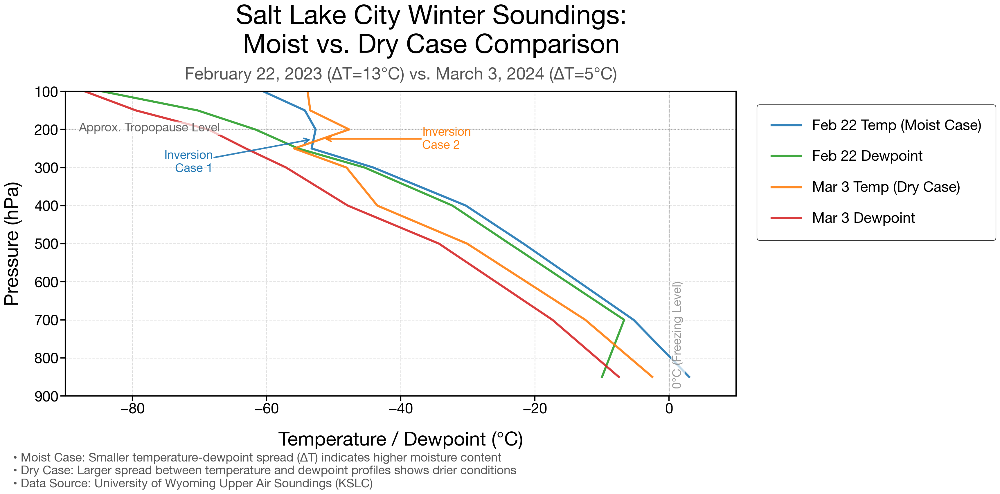

In [2]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import numpy as np

# Enhanced font and style configurations for poster presentation
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = ['Helvetica Neue', 'Helvetica', 'Arial']
mpl.rcParams['font.size'] = 20
mpl.rcParams['axes.titlesize'] = 44  # Restored to specified 44pt
mpl.rcParams['axes.labelsize'] = 32  # Upper end of specified range
mpl.rcParams['xtick.labelsize'] = 24
mpl.rcParams['ytick.labelsize'] = 24
mpl.rcParams['legend.fontsize'] = 24  # Increased for better readability
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['axes.edgecolor'] = '#333333'

# Data from Case Study 1 (February 22, 2023)
data_case1 = {
    "PRES": [850, 700, 500, 400, 300, 250, 200, 150, 100],
    "TMPC": [3.0, -5.3, -21.7, -30.3, -44.1, -53.3, -52.7, -54.3, -60.5],
    "DWPC": [-10.0, -6.7, -23.8, -32.3, -45.4, -55.3, -61.7, -70.3, -84.5]
}

# Data from Case Study 2 (March 3, 2024)
data_case2 = {
    "PRES": [850, 700, 500, 400, 300, 250, 200, 150, 100],
    "TMPC": [-2.5, -12.5, -30.1, -43.5, -48.1, -55.9, -47.7, -53.5, -53.9],
    "DWPC": [-7.5, -17.4, -34.3, -47.9, -57.1, -63.1, -68.7, -79.5, -87.1]
}

# Create figure with optimized size for poster
fig = plt.figure(figsize=(20, 10), facecolor='white', dpi=150)
ax = fig.add_subplot(111, facecolor='white')

# Plot with adjusted transparency and line thickness
plt.plot(data_case1['TMPC'], data_case1['PRES'],
         label='Feb 22 Temp (Moist Case)',
         color='#1F77B4', linewidth=3.5, alpha=0.9)
plt.plot(data_case1['DWPC'], data_case1['PRES'],
         label='Feb 22 Dewpoint',
         color='#2CA02C', linewidth=3.5, alpha=0.9)
plt.plot(data_case2['TMPC'], data_case2['PRES'],
         label='Mar 3 Temp (Dry Case)',
         color='#FF7F0E', linewidth=3.5, alpha=0.9)
plt.plot(data_case2['DWPC'], data_case2['PRES'],
         label='Mar 3 Dewpoint',
         color='#D62728', linewidth=3.5, alpha=0.9)

# Plot order: first grid (zorder=0 by default), then lines (zorder=1-2), then text (zorder=10)

# Add freezing level reference line with label
plt.axvline(x=0, color='gray', linestyle='--', alpha=0.6, linewidth=1.5, zorder=1)
plt.text(0.5, 875, '0°C (Freezing Level)', rotation=90,
         color='gray', fontsize=20, alpha=0.8, zorder=99,
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, pad=2))

# Add tropopause level annotations (approximate levels)
plt.axhline(y=200, color='#666666', linestyle=':', alpha=0.5, linewidth=2, zorder=1)
plt.text(-88, 205, 'Approx. Tropopause Level',
         color='#666666', fontsize=20, alpha=1.0, zorder=99,
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, pad=2))

# Mark inversion layers with left/right annotations
def mark_inversion(temps, pressures, color, case_num):
    for i in range(len(temps)-1):
        if temps[i+1] > temps[i]:  # Temperature increases with height
            # Calculate midpoint of inversion
            mid_temp = (temps[i] + temps[i+1]) / 2
            mid_press = (pressures[i] + pressures[i+1]) / 2

            # Set position based on case number
            if case_num == 1:
                text_offset = -15  # Place Case 1 to the left
                halign = 'right'
                vert_offset = 30   # Lower Case 1 annotation
                valign = 'top'
            else:
                text_offset = 15   # Place Case 2 to the right
                halign = 'left'
                vert_offset = 0    # Keep Case 2 at midpoint
                valign = 'center'

            # Add arrow pointing to inversion
            plt.annotate(f'Inversion\nCase {case_num}',
                xy=(mid_temp, mid_press),  # Point at middle of inversion
                xytext=(mid_temp + text_offset, mid_press + vert_offset),  # Adjusted position
                color=color,
                fontsize=20,
                fontweight='bold',
                alpha=1.0,
                horizontalalignment=halign,
                verticalalignment=valign,
                arrowprops=dict(arrowstyle='->',
                               color=color,
                               alpha=0.9,
                               linewidth=2.5,
                               shrinkA=0,
                               shrinkB=5))

mark_inversion(data_case1['TMPC'], data_case1['PRES'], '#1F77B4', 1)
mark_inversion(data_case2['TMPC'], data_case2['PRES'], '#FF7F0E', 2)

# Axis configurations
plt.gca().invert_yaxis()
plt.ylim(900, 100)
plt.xlim(-90, 10)

# Enhanced labels with increased padding
plt.xlabel('Temperature / Dewpoint (°C)', labelpad=25, fontweight='bold', color='black')
plt.ylabel('Pressure (hPa)', labelpad=20, fontweight='bold', color='black')
ax.tick_params(colors='black', length=8, width=2)

# Updated title with clear comparison emphasis
plt.suptitle('Salt Lake City Winter Soundings:\nMoist vs. Dry Case Comparison',
             fontsize=44, fontweight='bold', y=1.05, color='black')
plt.title('February 22, 2023 (ΔT=13°C) vs. March 3, 2024 (ΔT=5°C)',
         fontsize=28, pad=20, color='#555555')

# Optimized legend placement and style
legend = plt.legend(bbox_to_anchor=(1.02, 0.98),
                   loc='upper left',
                   frameon=True,
                   facecolor='white',
                   edgecolor='#333333',
                   borderpad=1,
                   labelspacing=1.2)
legend.get_frame().set_alpha(1.0)
plt.setp(legend.get_texts(), color='black')

# Refined grid with better visibility
plt.grid(True, linestyle='--', alpha=0.3, color='#888888', linewidth=1.2)

# Comprehensive footnote
plt.figtext(0.02, -0.06,
            '• Moist Case: Smaller temperature-dewpoint spread (ΔT) indicates higher moisture content\n'
            '• Dry Case: Larger spread between temperature and dewpoint profiles shows drier conditions\n'
            '• Data Source: University of Wyoming Upper Air Soundings (KSLC)',
            fontsize=20, ha='left', color='#555555')

# Clean spines with adjusted thickness
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_color('black')

# Optimized layout
plt.subplots_adjust(top=0.85, bottom=0.15, left=0.08, right=0.85)

plt.show()

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.30 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.51 seconds).


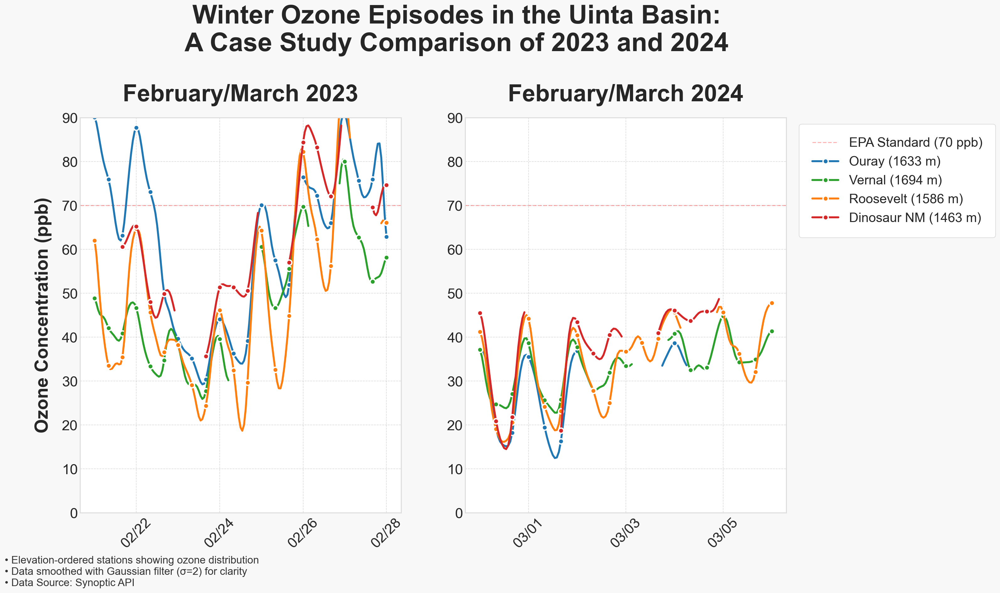

In [3]:
from datetime import datetime, timedelta
from synoptic import TimeSeries
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.ndimage import gaussian_filter1d
import matplotlib.dates as mdates

# Enhanced font and style configurations with adjusted sizes
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Helvetica Neue', 'Helvetica', 'Arial']
rcParams['font.size'] = 22  # Slightly reduced base size
rcParams['axes.titlesize'] = 36  # Reduced from 42 for better hierarchy
rcParams['axes.labelsize'] = 28  # Adjusted from 32
rcParams['xtick.labelsize'] = 22  # Slightly reduced
rcParams['ytick.labelsize'] = 22
rcParams['legend.fontsize'] = 20
rcParams['axes.linewidth'] = 1.5  # Reduced from 2
rcParams['axes.edgecolor'] = '#333333'

# Token and time periods remain the same
token = 'YOUR_TOKEN_HERE'
periods = [
    {
        'start': datetime(2023, 2, 21),
        'end': datetime(2023, 2, 28),
        'title': '2023'
    },
    {
        'start': datetime(2024, 2, 29),
        'end': datetime(2024, 3, 6),
        'title': '2024'
    }
]

# Station information with verified colors
ozone_stations = {
    'A1622': {'name': 'Ouray (1633 m)', 'color': '#1F77B4'},  # More muted blue
    'QV4': {'name': 'Vernal (1694 m)', 'color': '#2CA02C'},   # Forest green
    'QRS': {'name': 'Roosevelt (1586 m)', 'color': '#FF7F0E'}, # Orange
    'A3822': {'name': 'Dinosaur NM (1463 m)', 'color': '#D62728'} # Dark red
}

try:
    # Create figure with reduced size
    plt.style.use('seaborn-v0_8-white')
    fig = plt.figure(figsize=(20, 12), facecolor='white', dpi=150)  # Reduced size and DPI
    gs = plt.GridSpec(1, 2, wspace=0.2)

    fig.patch.set_facecolor('white')

    # Create ozone subplots
    ax_ozone1 = fig.add_subplot(gs[0, 0])
    ax_ozone2 = fig.add_subplot(gs[0, 1])

    # Add EPA standard reference line
    for ax in [ax_ozone1, ax_ozone2]:
        ax.axhline(y=70, color='#FF0000', linestyle='--', alpha=0.3,
                  linewidth=1.5, label='EPA Standard (70 ppb)')

    # Process each time period
    for idx, period in enumerate(periods):
        ax_ozone = ax_ozone1 if idx == 0 else ax_ozone2

        # Get ozone data
        df_ozone = TimeSeries(
            token=token,
            stid=list(ozone_stations.keys()),
            vars=['ozone_concentration'],
            start=period['start'],
            end=period['end']
        ).df()

        # Plot ozone concentration
        for station, info in ozone_stations.items():
            station_ozone = df_ozone.filter(
                (pl.col('stid') == station) &
                (pl.col('variable') == 'ozone_concentration')
            )

            if len(station_ozone) > 0:
                values = station_ozone['value']
                smoothed_values = gaussian_filter1d(values, sigma=2)

                # Adjusted line and marker properties
                ax_ozone.plot(station_ozone['date_time'],
                            smoothed_values,
                            '-o',
                            label=info['name'],
                            color=info['color'],
                            linewidth=3,  # Reduced from 4
                            markersize=8,  # Reduced from 12
                            markeredgecolor='white',
                            markeredgewidth=2,  # Reduced from 3
                            markevery=8)  # Increased spacing between markers

        # Configure ozone subplot
        ax_ozone.set_title(f'February/March {period["title"]}',
                          pad=25, fontweight='bold')
        if idx == 0:
            ax_ozone.set_ylabel('Ozone Concentration (ppb)',
                              labelpad=15, fontweight='bold')

        # Enhanced grid styling with slightly darker lines
        ax_ozone.grid(True, linestyle='--', alpha=0.3, color='gray', which='major')
        ax_ozone.set_facecolor('white')
        ax_ozone.set_ylim(0, 90)  # Adjusted to typical maximum
        ax_ozone.set_axisbelow(True)

        # Format x-axis
        ax_ozone.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
        ax_ozone.xaxis.set_major_locator(mdates.DayLocator(interval=2))
        ax_ozone.tick_params(axis='x', rotation=45, pad=5)

        # Clean spines
        for spine in ax_ozone.spines.values():
            spine.set_linewidth(1.5)
            spine.set_color('#333333')

    # Add legend to rightmost plot with adjusted position
    legend = ax_ozone2.legend(bbox_to_anchor=(1.02, 1),
                             loc='upper left',
                             frameon=True,
                             facecolor='white',
                             edgecolor='#DDDDDD',
                             borderpad=1)
    legend.get_frame().set_alpha(1.0)

    # Add overall title with adjusted size
    fig.suptitle('Winter Ozone Episodes in the Uinta Basin:\nA Case Study Comparison of 2023 and 2024',
                 fontsize=40, fontweight='bold', y=1.05, x=0.5,
                 horizontalalignment='center')

    # Enhanced footnote with more details
    plt.figtext(0.02, 0.02,
                '• Elevation-ordered stations showing ozone distribution\n' +
                '• Data smoothed with Gaussian filter (σ=2) for clarity\n' +
                '• Data Source: Synoptic API',
                fontsize=16, ha='left', color='#333333')

    # Adjust layout
    plt.subplots_adjust(top=0.85, bottom=0.15, left=0.1, right=0.85)

    # Set background colors
    fig.patch.set_facecolor('#F8F8F8')
    for ax in [ax_ozone1, ax_ozone2]:
        ax.set_facecolor('white')
        for spine in ['top', 'right', 'bottom', 'left']:
            ax.spines[spine].set_visible(True)
            ax.spines[spine].set_color('#DDDDDD')

    plt.show()

except Exception as e:
    print(f"Error: {str(e)}")


Starting analysis for period: Feb 2023
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.25 seconds).
Ozone Data for Feb 2023:
    stid                 date_time             variable  sensor_index  \
0  A1622 2023-02-21 00:00:00+00:00  ozone_concentration             1   
1  A1622 2023-02-21 01:00:00+00:00  ozone_concentration             1   
2  A1622 2023-02-21 02:00:00+00:00  ozone_concentration             1   
3  A1622 2023-02-21 03:00:00+00:00  ozone_concentration             1   
4  A1622 2023-02-21 04:00:00+00:00  ozone_concentration             1   

   is_derived  value units     id   name  elevation  ...  mnet_id  state  \
0       False   98.0   ppb  28963  Ouray     4813.0  ...      136     UT   
1       False   86.0   ppb  28963  Ouray     4813.0  ...      136     UT   
2       False   85.0   ppb  28963  Ouray     4813.0  ...      136     UT   
3       False   86.0   ppb  28963  Ouray     4813.0  ...      136     UT   
4       False

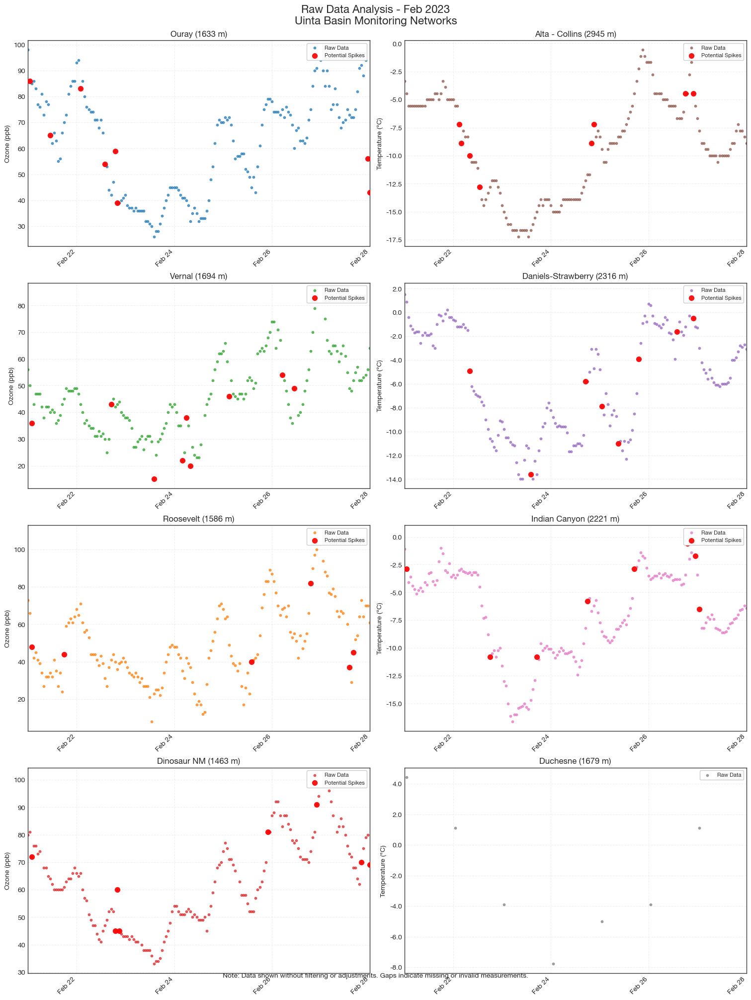

Completed analysis for period: Feb 2023

Starting analysis for period: Feb/Mar 2024
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.24 seconds).
Ozone Data for Feb/Mar 2024:
    stid                 date_time             variable  sensor_index  \
0  A1622 2024-02-29 00:00:00+00:00  ozone_concentration             1   
1  A1622 2024-02-29 01:00:00+00:00  ozone_concentration             1   
2  A1622 2024-02-29 02:00:00+00:00  ozone_concentration             1   
3  A1622 2024-02-29 03:00:00+00:00  ozone_concentration             1   
4  A1622 2024-02-29 04:00:00+00:00  ozone_concentration             1   

   is_derived  value units     id   name  elevation  ...  mnet_id  state  \
0       False   38.0   ppb  28963  Ouray     4813.0  ...      136     UT   
1       False   37.0   ppb  28963  Ouray     4813.0  ...      136     UT   
2       False   38.0   ppb  28963  Ouray     4813.0  ...      136     UT   
3       False   37.0   ppb  28963  Ouray 

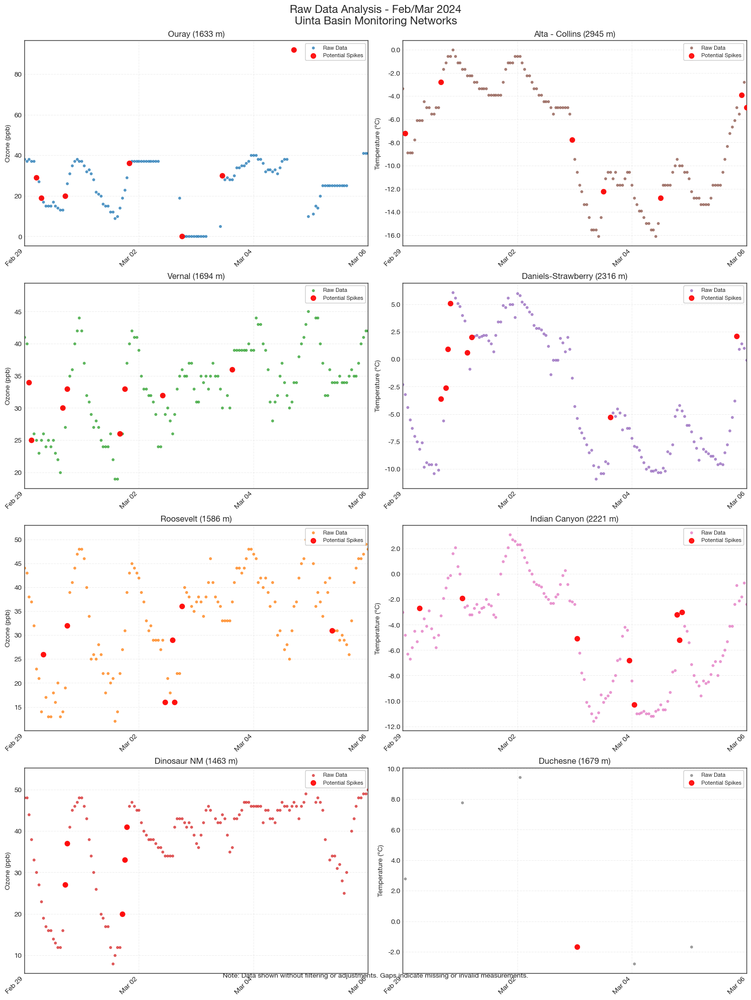

Completed analysis for period: Feb/Mar 2024


In [4]:
import pandas as pd
import numpy as np
from datetime import datetime
from dataclasses import dataclass
from typing import Dict, List, Optional, Tuple
from synoptic import TimeSeries  # Ensure this module is correctly installed and configured
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.dates as mdates
import traceback  # For detailed error messages

@dataclass
class Period:
    start: datetime
    end: datetime
    title: str

@dataclass
class Station:
    name: str
    color: str
    elevation: float
    ranges: Dict[str, Tuple[float, float]]

class DataSpikeAnalyzer:
    def __init__(self, token: str):
        self.token = token
        self.setup_plotting_style()
        self.setup_periods()
        self.setup_stations()

    @staticmethod
    def setup_plotting_style() -> None:
        rcParams.update({
            'font.family': 'sans-serif',
            'font.sans-serif': ['Helvetica Neue', 'Helvetica', 'Arial'],
            'font.size': 12,  # Adjusted for better readability in smaller figures
            'axes.titlesize': 14,
            'axes.labelsize': 12,
            'xtick.labelsize': 10,
            'ytick.labelsize': 10,
            'legend.fontsize': 10,
            'axes.linewidth': 1.0,
            'axes.edgecolor': '#333333',
            'figure.facecolor': 'white',
            'axes.facecolor': 'white',
            'figure.dpi': 100  # Adjusted for standard displays
        })

    def setup_periods(self) -> None:
        self.case_study_periods = [
            Period(datetime(2023, 2, 21), datetime(2023, 2, 28), 'Feb 2023'),
            Period(datetime(2024, 2, 29), datetime(2024, 3, 6), 'Feb/Mar 2024')
        ]

    def setup_stations(self) -> None:
        # Define ranges for reference only - won't be used for limiting data
        ozone_ranges = {
            'ozone_concentration': (0, 200)  # ppb
        }

        synoptic_ranges = {
            'snow_depth': (0, 500),        # cm
            'wind_speed': (0, 50),         # m/s
            'air_temp': (-40, 40),         # °C
            'relative_humidity': (0, 100)   # %
        }

        self.ozone_stations = {
            'A1622': Station('Ouray', '#1F77B4', 1633, ozone_ranges),
            'QV4': Station('Vernal', '#2CA02C', 1694, ozone_ranges),
            'QRS': Station('Roosevelt', '#FF7F0E', 1586, ozone_ranges),
            'A3822': Station('Dinosaur NM', '#D62728', 1463, ozone_ranges)
        }

        self.synoptic_stations = {
            'CLN': Station('Alta - Collins', '#8C564B', 2945, synoptic_ranges),
            'DSTU1': Station('Daniels-Strawberry', '#9467BD', 2316, synoptic_ranges),
            'ICYU1': Station('Indian Canyon', '#E377C2', 2221, synoptic_ranges),
            'COOPDSNU1': Station('Duchesne', '#7F7F7F', 1679, synoptic_ranges)
        }

    def detect_spikes(self, data: pd.DataFrame) -> pd.DataFrame:
        """Detect data spikes using simple statistical methods without filtering."""
        df = data.copy()

        # Ensure 'value' column exists
        if 'value' not in df.columns:
            raise ValueError("DataFrame must contain a 'value' column.")

        # Simple statistical outlier detection using raw values
        mean = df['value'].mean()
        std = df['value'].std()
        df['stat_spike'] = abs(df['value'] - mean) > 3 * std

        # Rate of change detection without smoothing
        df['roc'] = df['value'].diff().abs()
        roc_threshold = df['roc'].quantile(0.95)  # Flag top 5% of changes
        df['roc_spike'] = df['roc'] > roc_threshold

        # Combine spike flags
        df['is_spike'] = df['stat_spike'] | df['roc_spike']

        return df

    def plot_station_data(self, ax: plt.Axes, data: pd.DataFrame,
                         station: Station, variable: str, title: str, period: Period) -> None:
        """Plot raw time series data without any adjustments."""
        # Ensure datetime is properly formatted
        data = data.copy()
        data['date_time'] = pd.to_datetime(data['date_time'])

        # Drop rows where 'value' is NaN to reflect actual data gaps
        data = data.dropna(subset=['value'])

        # Set labels based on variable type
        if 'ozone' in variable.lower():
            ylabel = 'Ozone (ppb)'
        elif 'temp' in variable.lower():
            ylabel = 'Temperature (°C)'
        else:
            ylabel = variable.capitalize()

        # Plot raw data points with markers only to avoid smoothing
        ax.scatter(
            data['date_time'],
            data['value'],
            color=station.color,
            label='Raw Data',
            s=10,  # Smaller size for clarity
            alpha=0.7
        )

        # Highlight spikes if present
        if data['is_spike'].any():
            ax.scatter(
                data[data['is_spike']]['date_time'],
                data[data['is_spike']]['value'],
                color='red',
                s=50,  # Larger size to stand out
                alpha=0.9,
                label='Potential Spikes',
                zorder=5
            )

        # Styling
        ax.set_title(f"{station.name} ({station.elevation:.0f} m)", fontsize=12, fontweight='bold')
        ax.set_ylabel(ylabel, fontsize=10, fontweight='bold')

        # Grid behind data
        ax.grid(True, linestyle='--', alpha=0.3, zorder=0)
        ax.set_axisbelow(True)

        # Legend with white background
        if data['is_spike'].any():
            ax.legend(loc='upper right',
                     frameon=True,
                     facecolor='white',
                     edgecolor='#CCCCCC',
                     framealpha=1.0,
                     fontsize=8)
        else:
            ax.legend(loc='upper right',
                     frameon=True,
                     facecolor='white',
                     edgecolor='#CCCCCC',
                     framealpha=1.0,
                     fontsize=8)

        # Format x-axis with proper date labels
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
        ax.xaxis.set_major_locator(mdates.DayLocator(interval=2))
        ax.xaxis.set_minor_locator(mdates.DayLocator())
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')

        # Format y-axis with appropriate precision
        if 'temp' in variable.lower():
            ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.1f}'))
        else:
            ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}'))

        # Clean white background and border
        ax.set_facecolor('white')
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_linewidth(1.0)
            spine.set_color('#333333')

        # Ensure x-axis limits cover the entire period
        ax.set_xlim(period.start, period.end)

    def analyze_spikes(self, period: Period) -> None:
        """Analyze and visualize raw data for a given period."""
        self.current_period = period  # To access in plot_station_data

        # Set up the figure with constrained_layout for better spacing
        fig, axs = plt.subplots(4, 2, figsize=(15, 20), constrained_layout=True)  # Reduced figure size
        fig.suptitle(f'Raw Data Analysis - {period.title}\nUinta Basin Monitoring Networks', fontsize=16, fontweight='bold')

        # Add column titles
        axs[0, 0].set_title('Ozone Concentration', fontsize=14, fontweight='bold', pad=15)
        axs[0, 1].set_title('Air Temperature', fontsize=14, fontweight='bold', pad=15)

        # Flatten axs for easy iteration
        axs_flat = axs.flatten()

        # Analyze ozone data
        df_ozone = TimeSeries(
            token=self.token,
            stid=list(self.ozone_stations.keys()),
            vars=['ozone_concentration'],
            start=period.start,
            end=period.end
        ).df().to_pandas()

        # Debugging: Print ozone data sample
        print(f"Ozone Data for {period.title}:")
        print(df_ozone.head())
        print(df_ozone.info())

        # Plot each ozone station
        for idx, (station_id, station) in enumerate(self.ozone_stations.items()):
            ax = axs_flat[idx * 2]  # Ozone plots on even indices
            station_data = df_ozone[df_ozone['stid'] == station_id].copy()
            if not station_data.empty:
                station_data = self.detect_spikes(station_data)
                self.plot_station_data(
                    ax, station_data, station,
                    'ozone_concentration', f'Ozone Data - {period.title}', period
                )
            else:
                ax.text(0.5, 0.5, 'No Data Available',
                        horizontalalignment='center',
                        verticalalignment='center',
                        fontsize=10, color='gray')
                ax.set_title(f"{station.name} ({station.elevation:.0f} m)", fontsize=12, fontweight='bold')
                ax.set_ylabel('Ozone (ppb)', fontsize=10, fontweight='bold')
                ax.grid(True, linestyle='--', alpha=0.3, zorder=0)

        # Analyze synoptic data for temperature
        df_synoptic = TimeSeries(
            token=self.token,
            stid=list(self.synoptic_stations.keys()),
            vars=['air_temp'],
            start=period.start,
            end=period.end
        ).df().to_pandas()

        # Debugging: Print synoptic data sample
        print(f"Synoptic Data for {period.title}:")
        print(df_synoptic.head())
        print(df_synoptic.info())

        # Plot each synoptic station
        for idx, (station_id, station) in enumerate(self.synoptic_stations.items()):
            ax = axs_flat[idx * 2 + 1]  # Temperature plots on odd indices
            station_data = df_synoptic[df_synoptic['stid'] == station_id].copy()
            if not station_data.empty:
                station_data = self.detect_spikes(station_data)
                self.plot_station_data(
                    ax, station_data, station,
                    'air_temp', f'Temperature Data - {period.title}', period
                )
            else:
                ax.text(0.5, 0.5, 'No Data Available',
                        horizontalalignment='center',
                        verticalalignment='center',
                        fontsize=10, color='gray')
                ax.set_title(f"{station.name} ({station.elevation:.0f} m)", fontsize=12, fontweight='bold')
                ax.set_ylabel('Temperature (°C)', fontsize=10, fontweight='bold')
                ax.grid(True, linestyle='--', alpha=0.3, zorder=0)

        # Add note about data gaps
        fig.text(0.5, 0.02,
                 'Note: Data shown without filtering or adjustments. Gaps indicate missing or invalid measurements.',
                 fontsize=10, ha='center')

        plt.show()

    def analyze_all_periods(self) -> None:
        """Analyze and visualize raw data for all defined periods."""
        for period in self.case_study_periods:
            print(f"\nStarting analysis for period: {period.title}")
            self.analyze_spikes(period)
            print(f"Completed analysis for period: {period.title}")

def main():
    try:
        # Initialize the analyzer with your token
        analyzer = DataSpikeAnalyzer('YOUR_TOKEN_HERE')

        # Analyze all defined periods
        analyzer.analyze_all_periods()

    except Exception as e:
        print(f"Error: {e}")
        traceback.print_exc()

if __name__ == "__main__":
    main()


Successfully loaded and processed shapefile

Processing 2023 period...
✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2023-Feb-20 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/xarray/backends/plugins.py:110: RuntimeWarning: Engine 'cfradial1' loading failed:
cannot import name 'HybridMappingProxy' from 'xarray.core.utils' (/opt/anaconda3/lib/python3.12/site-packages/xarray/core/utils.py)
  external_backend_entrypoints = backends_dict_from_pkg(entrypoints_unique)
/opt/anaconda3/lib/python3.12/site-packages/xarray/backends/plugins.py:110: RuntimeWarning: Engine 'datamet' loading failed:
cannot import name 'HybridMappingProxy' from 'xarray.core.utils' (/opt/anaconda3/lib/python3.12/site-packages/xarray/core/utils.py)
  external_backend_entrypoints = backends_dict_from_pkg(entrypoints_unique)
/opt/anaconda3/lib/python3.12/site-packages/xarray/backends/plugins.py:110: RuntimeWarning: Engine 'furuno' loading faile

✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2023-Feb-21 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2023-Feb-22 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2023-Feb-23 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2023-Feb-24 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2023-Feb-25 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2023-Feb-26 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2023-Feb-27 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


Successfully plotted county boundaries

Processing 2024 period...
✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2024-Feb-27 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2024-Feb-28 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2024-Feb-29 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2024-Mar-01 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2024-Mar-02 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2024-Mar-03 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2024-Mar-04 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


✅ Found ┊ model=gefs ┊ product=atmos.5b ┊ 2024-Mar-05 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/opt/anaconda3/lib/python3.12/site-packages/herbie/core.py:1112: UserWarning: Will not remove GRIB file because it previously existed.
  warnings.warn("Will not remove GRIB file because it previously existed.")
/opt/anaconda3/lib/python3.12/site-packages/cfgrib/xarray_plugin.py:131: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(


Successfully plotted county boundaries


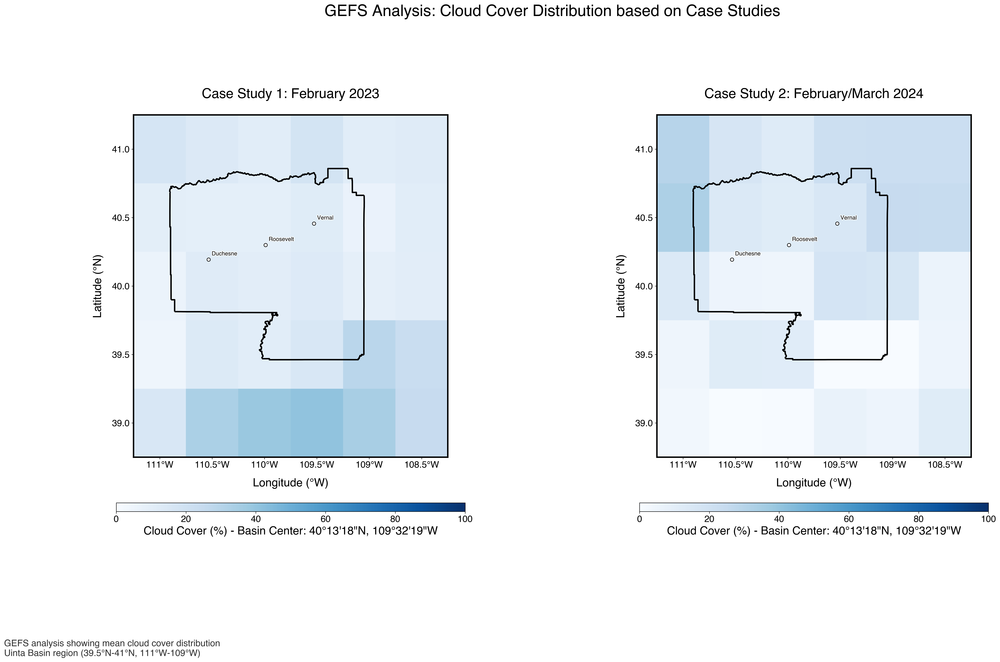

In [5]:
from datetime import datetime
import matplotlib.pyplot as plt
from herbie import Herbie
import numpy as np
import xarray as xr
from matplotlib import rcParams
import geopandas as gpd
from matplotlib import patheffects as path_effects

# Set style for light background with enhanced readability
plt.style.use('default')
plt.rcParams.update({
    'font.family': 'Helvetica',
    'font.size': 16,
    'axes.labelsize': 20,
    'axes.titlesize': 24,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'figure.titlesize': 28
})

def get_gefs_clouds(date):
    H = Herbie(
        date,
        model="gefs",
        product="atmos.5b",
        member="c00"
    )

    try:
        H.download("TCDC")
        ds = H.xarray("TCDC")
        ds.coords['longitude'] = (ds.coords['longitude'] + 180) % 360 - 180
        ds = ds.sel(
            longitude=slice(-111.0, -108.5),  # Extend west to include Wasatch influence
            latitude=slice(41.0, 39.0)        # Include Uinta Mountains to Book Cliffs
        )
        return ds
    except Exception as e:
        print(f"Error processing {date}: {str(e)}")
        return None

def plot_period(dates, ax, title, counties_gdf):
    ax.set_aspect('equal')
    datasets = []

    for date in dates:
        ds = get_gefs_clouds(date)
        if ds is not None:
            datasets.append(ds)

    if datasets:
        composite = xr.concat(datasets, dim='time').mean(dim='time')

        plot = composite.tcc.plot(
            ax=ax,
            cmap='Blues',
            vmin=0,
            vmax=100,
            cbar_kwargs={
                'label': 'Cloud Cover (%) - Basin Center: 40°13\'18"N, 109°32\'19"W',
                'orientation': 'horizontal',
                'pad': 0.1,
                'shrink': 0.8,
                'aspect': 40,
                'format': '%d',
                'ticks': [0, 20, 40, 60, 80, 100]
            },
            robust=True,
            zorder=1
        )

        # Plot county boundaries if available
        if counties_gdf is not None:
            try:
                # Filter for Duchesne and Uintah counties, excluding their shared boundary
                mask = (
                    (counties_gdf['RightCount'].isin(['UINTAH', 'DUCHESNE']) |
                     counties_gdf['LeftCounty'].isin(['UINTAH', 'DUCHESNE'])) &
                    ~((counties_gdf['RightCount'] == 'UINTAH') &
                      (counties_gdf['LeftCounty'] == 'DUCHESNE'))
                )
                counties_filtered = counties_gdf[mask]
                counties_filtered.plot(ax=ax, facecolor='none', edgecolor='black',
                                    linewidth=2.5, alpha=1.0, zorder=5)
                print("Successfully plotted county boundaries")
            except Exception as e:
                print(f"Error plotting county boundaries: {str(e)}")

        ax.set_title(title, pad=30)
        ax.set_xlabel('Longitude (°W)', labelpad=15)
        ax.set_ylabel('Latitude (°N)', labelpad=15)

        ax.set_xticks([-111, -110.5, -110, -109.5, -109, -108.5])
        ax.set_xticklabels(['111°W', '110.5°W', '110°W', '109.5°W', '109°W', '108.5°W'])

        ax.grid(False)

        # Cities with coordinates
        cities = {
            'Duchesne': {'lon': -110.533742, 'lat': 40.193815},
            'Roosevelt': {'lon': -109.989831, 'lat': 40.299167},
            'Vernal': {'lon': -109.528, 'lat': 40.456}
        }

        # Plot cities with white-outlined labels
        for city, coords in cities.items():
            ax.plot(coords['lon'], coords['lat'], 'o',
                   color='white', markeredgecolor='black',
                   markeredgewidth=1.0, markersize=6, zorder=10)

            text = ax.text(coords['lon'] + 0.03, coords['lat'] + 0.03,
                         city, fontsize=10, zorder=12)
            text.set_path_effects([path_effects.withStroke(linewidth=2, foreground='white')])

        for spine in ax.spines.values():
            spine.set_linewidth(2.5)
            spine.set_color('black')

# Load the Counties shapefile
try:
    counties_gdf = gpd.read_file('/Users/a02428741/PycharmProjects/snowshadow/notebooks/shps/Counties_LabelLines/Counties_LabelLines.shp')
    # Ensure the CRS is in the correct projection (WGS 84)
    if counties_gdf.crs is not None and counties_gdf.crs != 'EPSG:4326':
        counties_gdf = counties_gdf.to_crs('EPSG:4326')
    print("Successfully loaded and processed shapefile")
except Exception as e:
    print(f"Error loading shapefile: {str(e)}")
    counties_gdf = None

dates_2023 = [
    '2023-02-20 00:00', '2023-02-21 00:00', '2023-02-22 00:00',
    '2023-02-23 00:00', '2023-02-24 00:00', '2023-02-25 00:00',
    '2023-02-26 00:00', '2023-02-27 00:00'
]

dates_2024 = [
    '2024-02-27 00:00', '2024-02-28 00:00', '2024-02-29 00:00',
    '2024-03-01 00:00', '2024-03-02 00:00', '2024-03-03 00:00',
    '2024-03-04 00:00', '2024-03-05 00:00'
]

fig = plt.figure(figsize=(28, 16), facecolor='white', dpi=300)
gs = plt.GridSpec(1, 2, wspace=0.2)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])

print("\nProcessing 2023 period...")
plot_period(dates_2023, ax1, 'Case Study 1: February 2023', counties_gdf)

print("\nProcessing 2024 period...")
plot_period(dates_2024, ax2, 'Case Study 2: February/March 2024', counties_gdf)

fig.suptitle('GEFS Analysis: Cloud Cover Distribution based on Case Studies',
             y=1.02, x=0.5, horizontalalignment='center')

plt.figtext(0.02, 0.02,
            'GEFS analysis showing mean cloud cover distribution\nUinta Basin region (39.5°N-41°N, 111°W-109°W)',
            fontsize=16, ha='left', color='#333333')

plt.subplots_adjust(top=0.85, bottom=0.15, left=0.08, right=0.92)

plt.show()

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.23 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.23 seconds).


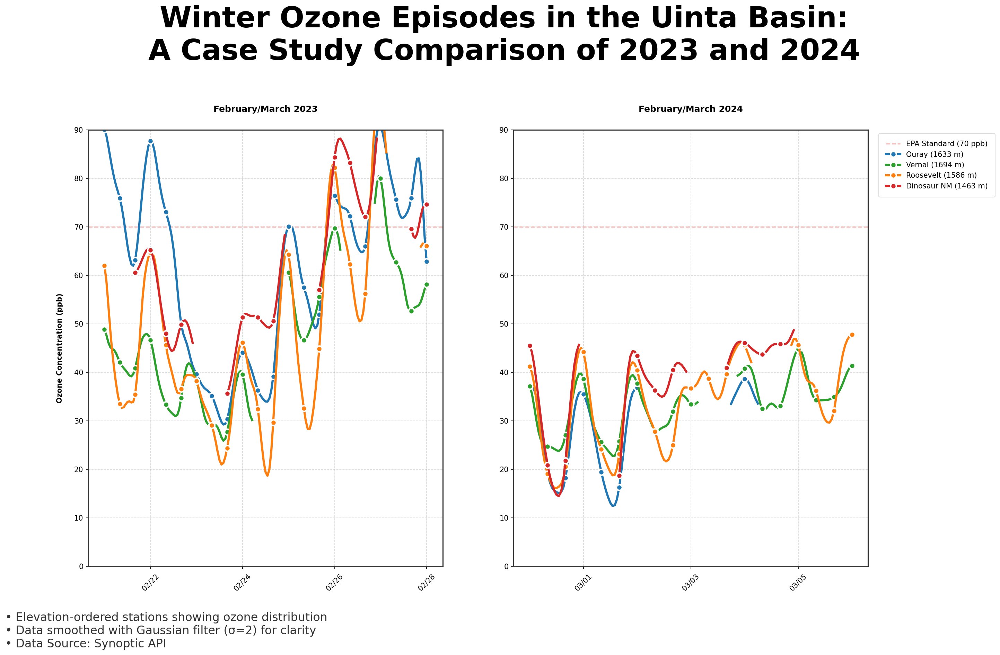

In [6]:
from datetime import datetime, timedelta
from synoptic import TimeSeries
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.ndimage import gaussian_filter1d
import matplotlib.dates as mdates

# Enhanced font and style configurations with adjusted sizes
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Helvetica Neue', 'Helvetica', 'Arial']
rcParams['font.size'] = 22
rcParams['axes.titlesize'] = 36
rcParams['axes.labelsize'] = 28
rcParams['xtick.labelsize'] = 22
rcParams['ytick.labelsize'] = 22
rcParams['legend.fontsize'] = 20
rcParams['axes.linewidth'] = 1.5
rcParams['axes.edgecolor'] = '#333333'

# Token and time periods
token = 'YOUR_TOKEN_HERE'
periods = [
    {
        'start': datetime(2023, 2, 21),
        'end': datetime(2023, 2, 28),
        'title': '2023'
    },
    {
        'start': datetime(2024, 2, 29),
        'end': datetime(2024, 3, 6),
        'title': '2024'
    }
]

# Station information with verified colors
ozone_stations = {
    'A1622': {'name': 'Ouray (1633 m)', 'color': '#1F77B4'},
    'QV4': {'name': 'Vernal (1694 m)', 'color': '#2CA02C'},
    'QRS': {'name': 'Roosevelt (1586 m)', 'color': '#FF7F0E'},
    'A3822': {'name': 'Dinosaur NM (1463 m)', 'color': '#D62728'}
}

try:
    # Create figure with pure white background
    plt.style.use('default')  # Use default style instead of seaborn
    fig = plt.figure(figsize=(20, 12), dpi=150, facecolor='white')
    gs = plt.GridSpec(1, 2, wspace=0.2)

    # Ensure white background
    fig.patch.set_facecolor('white')

    # Create ozone subplots
    ax_ozone1 = fig.add_subplot(gs[0, 0])
    ax_ozone2 = fig.add_subplot(gs[0, 1])

    # Add EPA standard reference line
    for ax in [ax_ozone1, ax_ozone2]:
        ax.axhline(y=70, color='#FF0000', linestyle='--', alpha=0.3,
                  linewidth=1.5, label='EPA Standard (70 ppb)')

    # Process each time period
    for idx, period in enumerate(periods):
        ax_ozone = ax_ozone1 if idx == 0 else ax_ozone2

        # Get ozone data
        df_ozone = TimeSeries(
            token=token,
            stid=list(ozone_stations.keys()),
            vars=['ozone_concentration'],
            start=period['start'],
            end=period['end']
        ).df()

        # Plot ozone concentration
        for station, info in ozone_stations.items():
            station_ozone = df_ozone.filter(
                (pl.col('stid') == station) &
                (pl.col('variable') == 'ozone_concentration')
            )

            if len(station_ozone) > 0:
                values = station_ozone['value']
                smoothed_values = gaussian_filter1d(values, sigma=2)

                ax_ozone.plot(station_ozone['date_time'],
                            smoothed_values,
                            '-o',
                            label=info['name'],
                            color=info['color'],
                            linewidth=3,
                            markersize=8,
                            markeredgecolor='white',
                            markeredgewidth=2,
                            markevery=8)

        # Configure ozone subplot
        ax_ozone.set_title(f'February/March {period["title"]}',
                          pad=25, fontweight='bold')
        if idx == 0:
            ax_ozone.set_ylabel('Ozone Concentration (ppb)',
                              labelpad=15, fontweight='bold')

        # Enhanced grid styling with white background
        ax_ozone.grid(True, linestyle='--', alpha=0.3, color='gray', which='major')
        ax_ozone.set_facecolor('white')  # Explicit white background for subplot
        ax_ozone.set_ylim(0, 90)
        ax_ozone.set_axisbelow(True)

        # Format x-axis
        ax_ozone.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
        ax_ozone.xaxis.set_major_locator(mdates.DayLocator(interval=2))
        ax_ozone.tick_params(axis='x', rotation=45, pad=5)

        # Clean spines
        for spine in ax_ozone.spines.values():
            spine.set_linewidth(1.5)
            spine.set_color('#333333')

    # Add legend to rightmost plot
    legend = ax_ozone2.legend(bbox_to_anchor=(1.02, 1),
                             loc='upper left',
                             frameon=True,
                             facecolor='white',
                             edgecolor='#DDDDDD',
                             borderpad=1)
    legend.get_frame().set_alpha(1.0)

    # Add overall title
    fig.suptitle('Winter Ozone Episodes in the Uinta Basin:\nA Case Study Comparison of 2023 and 2024',
                 fontsize=40, fontweight='bold', y=1.05, x=0.5,
                 horizontalalignment='center')

    # Enhanced footnote
    plt.figtext(0.02, 0.02,
                '• Elevation-ordered stations showing ozone distribution\n' +
                '• Data smoothed with Gaussian filter (σ=2) for clarity\n' +
                '• Data Source: Synoptic API',
                fontsize=16, ha='left', color='#333333')

    # Adjust layout
    plt.subplots_adjust(top=0.85, bottom=0.15, left=0.1, right=0.85)

    plt.show()

except Exception as e:
    print(f"Error: {str(e)}")

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 3 stations (0.24 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 3 stations (0.23 seconds).


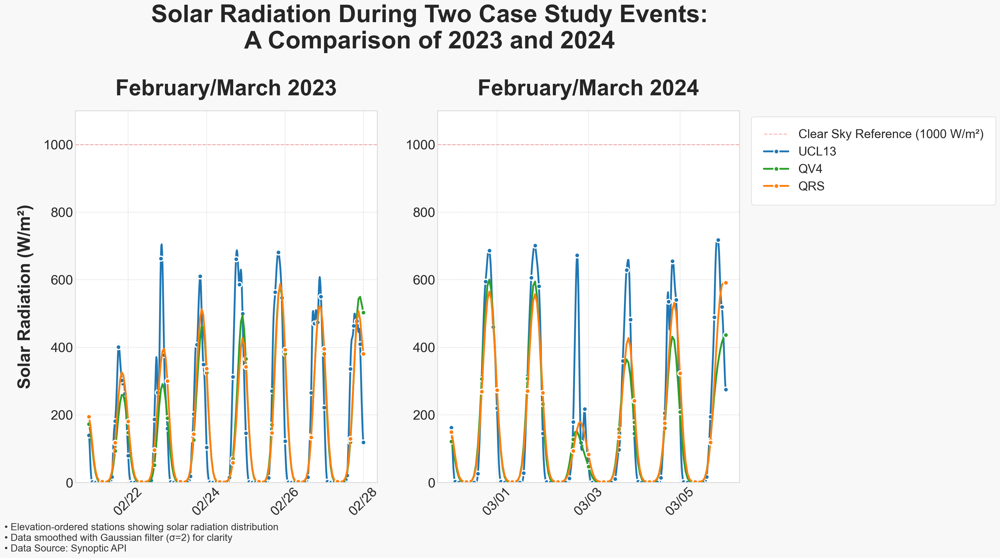

In [7]:
from datetime import datetime, timedelta
from synoptic import TimeSeries
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.ndimage import gaussian_filter1d
import matplotlib.dates as mdates

# Enhanced font and style configurations with adjusted sizes
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Helvetica Neue', 'Helvetica', 'Arial']
rcParams['font.size'] = 22  # Slightly reduced base size
rcParams['axes.titlesize'] = 36  # Reduced from 42 for better hierarchy
rcParams['axes.labelsize'] = 28  # Adjusted from 32
rcParams['xtick.labelsize'] = 22  # Slightly reduced
rcParams['ytick.labelsize'] = 22
rcParams['legend.fontsize'] = 20
rcParams['axes.linewidth'] = 1.5  # Reduced from 2
rcParams['axes.edgecolor'] = '#333333'

# Token and time periods remain the same
token = 'YOUR_TOKEN_HERE'
periods = [
    {
        'start': datetime(2023, 2, 21),
        'end': datetime(2023, 2, 28),
        'title': '2023'
    },
    {
        'start': datetime(2024, 2, 29),
        'end': datetime(2024, 3, 6),
        'title': '2024'
    }
]

# Updated station information with new station IDs and verified colors
solar_stations = {
    'UCL13': {'name': 'UCL13', 'color': '#1F77B4'},
    'QV4':   {'name': 'QV4',   'color': '#2CA02C'},
    'QRS':   {'name': 'QRS',   'color': '#FF7F0E'},
    'SURC2': {'name': 'SURC2', 'color': '#D62728'}
}

try:
    # Create figure with reduced size
    plt.style.use('seaborn-v0_8-white')
    fig = plt.figure(figsize=(20, 12), facecolor='white', dpi=150)
    gs = plt.GridSpec(1, 2, wspace=0.2)

    fig.patch.set_facecolor('white')

    # Create solar subplots
    ax_solar1 = fig.add_subplot(gs[0, 0])
    ax_solar2 = fig.add_subplot(gs[0, 1])

    # Add a reference line for clear sky solar irradiance (example value)
    for ax in [ax_solar1, ax_solar2]:
        ax.axhline(y=1000, color='#FF0000', linestyle='--', alpha=0.3,
                   linewidth=1.5, label='Clear Sky Reference (1000 W/m²)')

    # Process each time period
    for idx, period in enumerate(periods):
        ax_solar = ax_solar1 if idx == 0 else ax_solar2

        # Get solar radiation data
        df_solar = TimeSeries(
            token=token,
            stid=list(solar_stations.keys()),
            vars=['solar_radiation'],
            start=period['start'],
            end=period['end']
        ).df()

        # Plot solar radiation for each station
        for station, info in solar_stations.items():
            station_solar = df_solar.filter(
                (pl.col('stid') == station) &
                (pl.col('variable') == 'solar_radiation')
            )

            if len(station_solar) > 0:
                values = station_solar['value']
                smoothed_values = gaussian_filter1d(values, sigma=2)

                # Adjusted line and marker properties
                ax_solar.plot(
                    station_solar['date_time'],
                    smoothed_values,
                    '-o',
                    label=info['name'],
                    color=info['color'],
                    linewidth=3,
                    markersize=8,
                    markeredgecolor='white',
                    markeredgewidth=2,
                    markevery=8
                )

        # Configure solar subplot
        ax_solar.set_title(f'February/March {period["title"]}', pad=25, fontweight='bold')
        if idx == 0:
            ax_solar.set_ylabel('Solar Radiation (W/m²)', labelpad=15, fontweight='bold')

        ax_solar.grid(True, linestyle='--', alpha=0.3, color='gray', which='major')
        ax_solar.set_facecolor('white')
        ax_solar.set_ylim(0, 1100)  # Adjusted maximum value for solar radiation
        ax_solar.set_axisbelow(True)

        # Format x-axis
        ax_solar.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
        ax_solar.xaxis.set_major_locator(mdates.DayLocator(interval=2))
        ax_solar.tick_params(axis='x', rotation=45, pad=5)

        # Clean spines
        for spine in ax_solar.spines.values():
            spine.set_linewidth(1.5)
            spine.set_color('#333333')

    # Add legend to the rightmost plot with adjusted position
    legend = ax_solar2.legend(bbox_to_anchor=(1.02, 1),
                              loc='upper left',
                              frameon=True,
                              facecolor='white',
                              edgecolor='#DDDDDD',
                              borderpad=1)
    legend.get_frame().set_alpha(1.0)

    # Add overall title updated for solar
    fig.suptitle('Solar Radiation During Two Case Study Events:\nA Comparison of 2023 and 2024',
                 fontsize=40, fontweight='bold', y=1.05, x=0.5,
                 horizontalalignment='center')

    # Enhanced footnote with solar details
    plt.figtext(0.02, 0.02,
                '• Elevation-ordered stations showing solar radiation distribution\n'
                '• Data smoothed with Gaussian filter (σ=2) for clarity\n'
                '• Data Source: Synoptic API',
                fontsize=16, ha='left', color='#333333')

    # Adjust layout
    plt.subplots_adjust(top=0.85, bottom=0.15, left=0.1, right=0.85)

    # Set background colors
    fig.patch.set_facecolor('#F8F8F8')
    for ax in [ax_solar1, ax_solar2]:
        ax.set_facecolor('white')
        for spine in ['top', 'right', 'bottom', 'left']:
            ax.spines[spine].set_visible(True)
            ax.spines[spine].set_color('#DDDDDD')

    plt.show()

except Exception as e:
    print(f"Error: {str(e)}")


🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (1.45 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 3 stations (0.20 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.22 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.24 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.28 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.23 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.20 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.27 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.29 seconds).


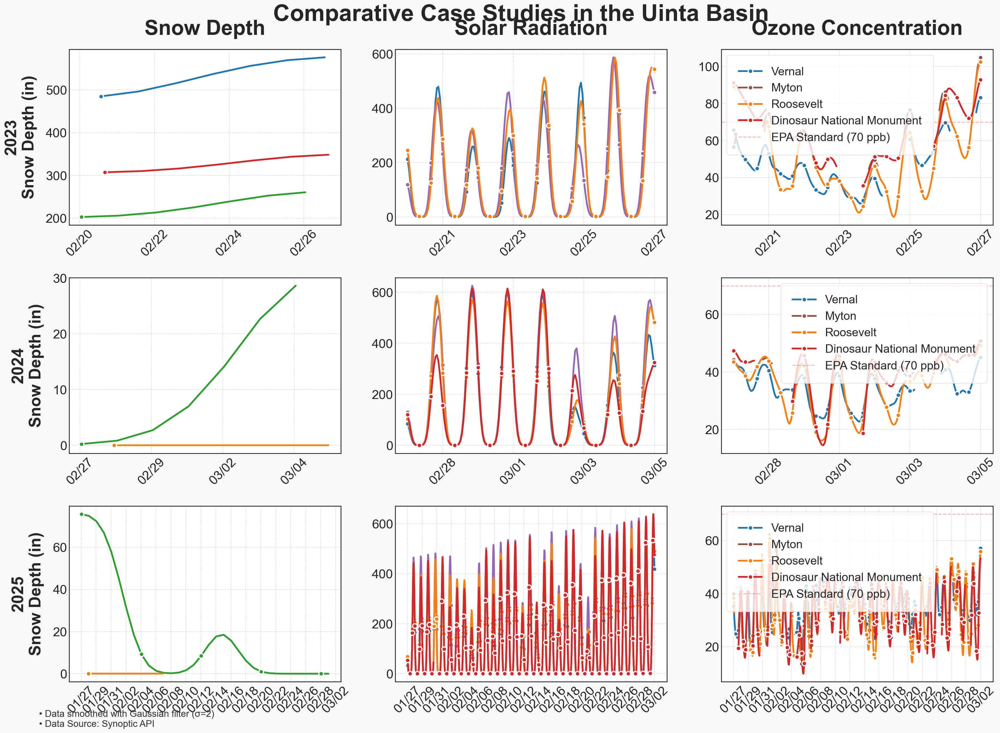

In [12]:
from datetime import datetime
from synoptic import TimeSeries
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.ndimage import gaussian_filter1d
import matplotlib.dates as mdates

# --- Styling ---
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Helvetica Neue', 'Helvetica', 'Arial']
rcParams['font.size'] = 22
rcParams['axes.titlesize'] = 36
rcParams['axes.labelsize'] = 28
rcParams['xtick.labelsize'] = 22
rcParams['ytick.labelsize'] = 22
rcParams['legend.fontsize'] = 20
rcParams['axes.linewidth'] = 1.5
rcParams['axes.edgecolor'] = '#333333'
plt.style.use('seaborn-v0_8-white')

# --- API Token ---
token = 'YOUR_API_TOKEN'

# --- Case Studies ---
# Each row is a case study with its date range.
case_studies = [
    {'year': '2023', 'start': datetime(2023, 2, 20), 'end': datetime(2023, 2, 27)},
    {'year': '2024', 'start': datetime(2024, 2, 27), 'end': datetime(2024, 3, 5)},
    {'year': '2025', 'start': datetime(2025, 1, 27), 'end': datetime(2025, 3, 2)}
]

# --- Variable Details ---
# Each key has its corresponding stations, y-axis label, and a nice title.
variables = {
    'snow_depth': {
        'title': 'Snow Depth',
        'ylabel': 'Snow Depth (in)',
        'stations': {
            'COOPVELU1': {'name': 'Vernal', 'color': '#1F77B4'},
            'COOPDSNU1': {'name': 'Duchesne', 'color': '#2CA02C'},
            'COOPROSU1': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'COOPDINU1': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    },
    'solar_radiation': {
        'title': 'Solar Radiation',
        'ylabel': 'Solar Radiation (W/m²)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'LRFU1': {'name': 'Little Red Fox', 'color': '#9467BD'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    },
    'ozone_concentration': {
        'title': 'Ozone Concentration',
        'ylabel': 'Ozone Concentration (ppb)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'A1388': {'name': 'Myton', 'color': '#8C564B'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    }
}

# Define the order of variables (columns)
variable_keys = ['snow_depth', 'solar_radiation', 'ozone_concentration']

try:
    # Create a 3x3 grid: 3 case studies (rows) x 3 variables (columns)
    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(24, 18), dpi=150)
    fig.patch.set_facecolor('#F8F8F8')

    # Loop over each case study (row)
    for row_idx, case in enumerate(case_studies):
        start_date = case['start']
        end_date = case['end']
        year = case['year']

        # Loop over each variable (column)
        for col_idx, var_key in enumerate(variable_keys):
            ax = axes[row_idx, col_idx]
            var_info = variables[var_key]
            stations = var_info['stations']

            # Get data from the Synoptic API
            ts = TimeSeries(
                token=token,
                stid=list(stations.keys()),
                vars=[var_key],
                start=start_date,
                end=end_date
            )
            df = ts.df()

            # Plot each station's data
            for stid, info in stations.items():
                station_data = df.filter(
                    (pl.col('stid') == stid) &
                    (pl.col('variable') == var_key)
                )
                if len(station_data) > 0:
                    values = station_data['value']
                    smoothed = gaussian_filter1d(values, sigma=2)
                    ax.plot(
                        station_data['date_time'],
                        smoothed,
                        '-o',
                        label=info['name'],
                        color=info['color'],
                        linewidth=3,
                        markersize=8,
                        markeredgecolor='white',
                        markeredgewidth=2,
                        markevery=8
                    )

            # For ozone concentration, add EPA reference line
            if var_key == 'ozone_concentration':
                ax.axhline(y=70, color='#FF0000', linestyle='--', alpha=0.3,
                           linewidth=1.5, label='EPA Standard (70 ppb)')

            # Set subplot title (only at the top of each column)
            if row_idx == 0:
                ax.set_title(var_info['title'], pad=25, fontweight='bold')

            # Label the y-axis on the leftmost column only
            if col_idx == 0:
                ax.set_ylabel(f"{year}\n{var_info['ylabel']}", labelpad=15, fontweight='bold')
            else:
                ax.set_ylabel('')

            # Format x-axis
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
            ax.xaxis.set_major_locator(mdates.DayLocator(interval=2))
            ax.tick_params(axis='x', rotation=45, pad=5)
            ax.grid(True, linestyle='--', alpha=0.3, color='gray', which='major')
            ax.set_facecolor('white')
            ax.set_axisbelow(True)

            # Clean up spines
            for spine in ax.spines.values():
                spine.set_linewidth(1.5)
                spine.set_color('#333333')

            # Add legend (only for the rightmost subplot to avoid clutter)
            if col_idx == 2:
                ax.legend(frameon=True, facecolor='white', edgecolor='#DDDDDD', borderpad=1)

    # Add an overall title and footnote
    fig.suptitle('Comparative Case Studies in the Uinta Basin', fontsize=40,
                 fontweight='bold', y=0.98, x=0.5, horizontalalignment='center')

    plt.figtext(0.02, 0.02,
                '• Data smoothed with Gaussian filter (σ=2)\n'
                '• Data Source: Synoptic API',
                fontsize=16, ha='left', color='#333333')

    plt.subplots_adjust(top=0.92, bottom=0.08, hspace=0.3, wspace=0.2, left=0.05, right=0.97)
    plt.show()

except Exception as e:
    print(f"Error: {str(e)}")

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.18 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 3 stations (0.21 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.20 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.20 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.20 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.20 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.37 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.24 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.28 seconds).


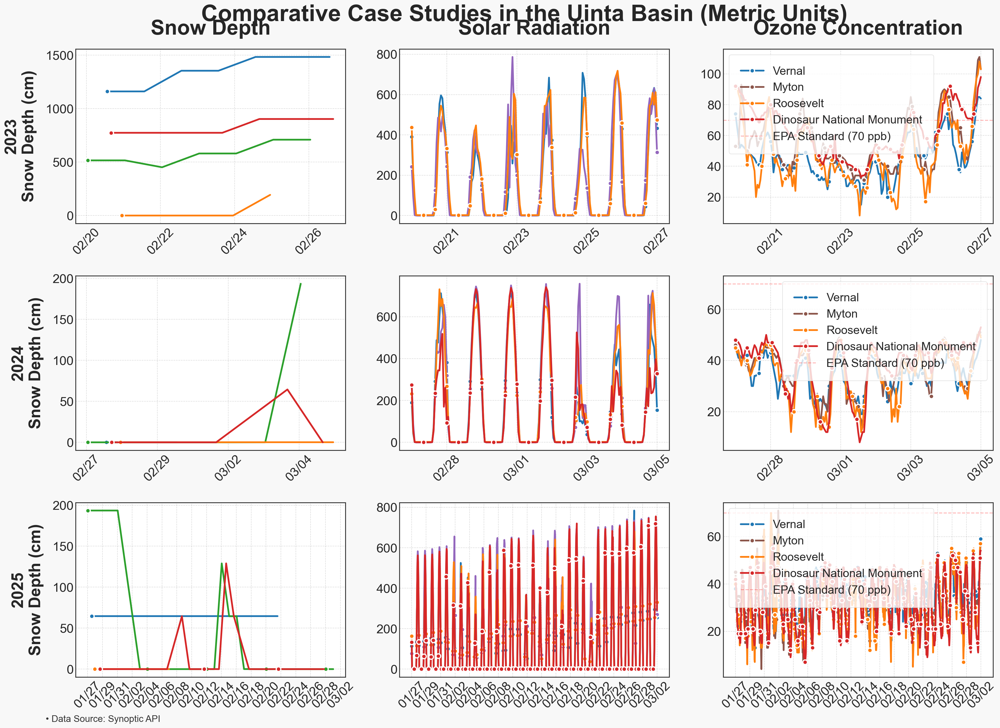

In [13]:
from datetime import datetime
from synoptic import TimeSeries
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.dates as mdates

# --- Styling ---
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Helvetica Neue', 'Helvetica', 'Arial']
rcParams['font.size'] = 22
rcParams['axes.titlesize'] = 36
rcParams['axes.labelsize'] = 28
rcParams['xtick.labelsize'] = 22
rcParams['ytick.labelsize'] = 22
rcParams['legend.fontsize'] = 20
rcParams['axes.linewidth'] = 1.5
rcParams['axes.edgecolor'] = '#333333'
plt.style.use('seaborn-v0_8-white')

# --- API Token ---
token = 'YOUR_API_TOKEN'

# --- Case Studies ---
# Each row is a case study with its specific date range.
case_studies = [
    {'year': '2023', 'start': datetime(2023, 2, 20), 'end': datetime(2023, 2, 27)},
    {'year': '2024', 'start': datetime(2024, 2, 27), 'end': datetime(2024, 3, 5)},
    {'year': '2025', 'start': datetime(2025, 1, 27), 'end': datetime(2025, 3, 2)}
]

# --- Variable Details ---
# For each variable, we set the title, y-axis label (in metric where needed),
# and station information with full names and consistent colors.
variables = {
    'snow_depth': {
        'title': 'Snow Depth',
        'ylabel': 'Snow Depth (cm)',  # Converted to metric (centimeters)
        'stations': {
            'COOPVELU1': {'name': 'Vernal', 'color': '#1F77B4'},
            'COOPDSNU1': {'name': 'Duchesne', 'color': '#2CA02C'},
            'COOPROSU1': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'COOPDINU1': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    },
    'solar_radiation': {
        'title': 'Solar Radiation',
        'ylabel': 'Solar Radiation (W/m²)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'LRFU1': {'name': 'Little Red Fox', 'color': '#9467BD'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    },
    'ozone_concentration': {
        'title': 'Ozone Concentration',
        'ylabel': 'Ozone Concentration (ppb)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'A1388': {'name': 'Myton', 'color': '#8C564B'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    }
}

# Define the order of variables (columns)
variable_keys = ['snow_depth', 'solar_radiation', 'ozone_concentration']

try:
    # Create a 3x3 grid: 3 case studies (rows) x 3 variables (columns)
    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(24, 18), dpi=150)
    fig.patch.set_facecolor('#F8F8F8')

    # Loop over each case study (row)
    for row_idx, case in enumerate(case_studies):
        start_date = case['start']
        end_date = case['end']
        year = case['year']

        # Loop over each variable (column)
        for col_idx, var_key in enumerate(variable_keys):
            ax = axes[row_idx, col_idx]
            var_info = variables[var_key]
            stations = var_info['stations']

            # Get data from the Synoptic API for current variable and date range
            ts = TimeSeries(
                token=token,
                stid=list(stations.keys()),
                vars=[var_key],
                start=start_date,
                end=end_date
            )
            df = ts.df()

            # Plot data for each station
            for stid, info in stations.items():
                station_data = df.filter(
                    (pl.col('stid') == stid) &
                    (pl.col('variable') == var_key)
                )
                # Filter out any rows with missing values
                station_data = station_data.filter(pl.col('value').is_not_null())

                if len(station_data) > 0:
                    # Convert date_time and value columns to lists
                    dates = station_data['date_time'].to_list()
                    values = station_data['value'].to_list()

                    # Convert snow depth from inches to centimeters
                    if var_key == 'snow_depth':
                        values = [v * 2.54 for v in values]

                    ax.plot(
                        dates,
                        values,
                        '-o',
                        label=info['name'],
                        color=info['color'],
                        linewidth=3,
                        markersize=8,
                        markeredgecolor='white',
                        markeredgewidth=2,
                        markevery=8
                    )

            # For ozone concentration, add EPA reference line (in ppb)
            if var_key == 'ozone_concentration':
                ax.axhline(y=70, color='#FF0000', linestyle='--', alpha=0.3,
                           linewidth=1.5, label='EPA Standard (70 ppb)')

            # Set subplot title for the top row only
            if row_idx == 0:
                ax.set_title(var_info['title'], pad=25, fontweight='bold')

            # Label the y-axis on the leftmost column only
            if col_idx == 0:
                ax.set_ylabel(f"{year}\n{var_info['ylabel']}", labelpad=15, fontweight='bold')
            else:
                ax.set_ylabel('')

            # Format x-axis to show dates
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
            ax.xaxis.set_major_locator(mdates.DayLocator(interval=2))
            ax.tick_params(axis='x', rotation=45, pad=5)
            ax.grid(True, linestyle='--', alpha=0.3, color='gray', which='major')
            ax.set_facecolor('white')
            ax.set_axisbelow(True)

            # Clean up spines for a neat look
            for spine in ax.spines.values():
                spine.set_linewidth(1.5)
                spine.set_color('#333333')

            # Add legend on the rightmost column to reduce clutter
            if col_idx == 2:
                ax.legend(frameon=True, facecolor='white', edgecolor='#DDDDDD', borderpad=1)

    # Overall title and footnote
    fig.suptitle('Comparative Case Studies in the Uinta Basin (Metric Units)', fontsize=40,
                 fontweight='bold', y=0.98, x=0.5, horizontalalignment='center')

    plt.figtext(0.02, 0.02,
                '• Data Source: Synoptic API',
                fontsize=16, ha='left', color='#333333')

    plt.subplots_adjust(top=0.92, bottom=0.08, hspace=0.3, wspace=0.2, left=0.05, right=0.97)
    plt.show()

except Exception as e:
    print(f"Error: {str(e)}")


🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.24 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 3 stations (0.25 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.21 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.20 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.19 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.21 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.19 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.25 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.24 seconds).


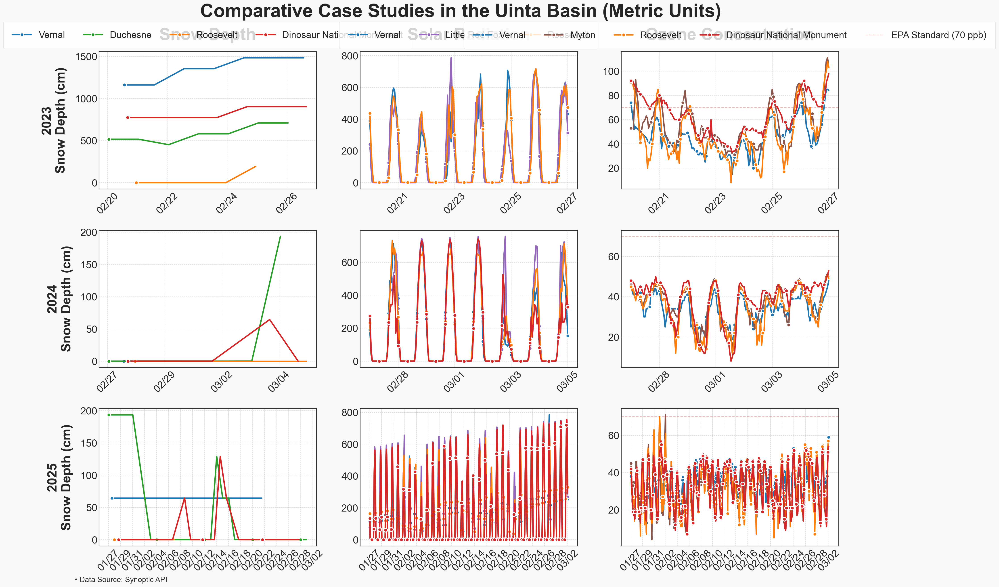

In [14]:
from datetime import datetime
from synoptic import TimeSeries
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.dates as mdates

# --- Styling ---
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Helvetica Neue', 'Helvetica', 'Arial']
rcParams['font.size'] = 22
rcParams['axes.titlesize'] = 36
rcParams['axes.labelsize'] = 28
rcParams['xtick.labelsize'] = 22
rcParams['ytick.labelsize'] = 22
rcParams['legend.fontsize'] = 20
rcParams['axes.linewidth'] = 1.5
rcParams['axes.edgecolor'] = '#333333'
plt.style.use('seaborn-v0_8-white')

# --- API Token ---
token = 'YOUR_API_TOKEN'

# --- Case Studies ---
case_studies = [
    {'year': '2023', 'start': datetime(2023, 2, 20), 'end': datetime(2023, 2, 27)},
    {'year': '2024', 'start': datetime(2024, 2, 27), 'end': datetime(2024, 3, 5)},
    {'year': '2025', 'start': datetime(2025, 1, 27), 'end': datetime(2025, 3, 2)}
]

# --- Variable Details ---
variables = {
    'snow_depth': {
        'title': 'Snow Depth',
        'ylabel': 'Snow Depth (cm)',  # metric: centimeters
        'stations': {
            'COOPVELU1': {'name': 'Vernal', 'color': '#1F77B4'},
            'COOPDSNU1': {'name': 'Duchesne', 'color': '#2CA02C'},
            'COOPROSU1': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'COOPDINU1': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    },
    'solar_radiation': {
        'title': 'Solar Radiation',
        'ylabel': 'Solar Radiation (W/m²)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'LRFU1': {'name': 'Little Red Fox', 'color': '#9467BD'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    },
    'ozone_concentration': {
        'title': 'Ozone Concentration',
        'ylabel': 'Ozone Concentration (ppb)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'A1388': {'name': 'Myton', 'color': '#8C564B'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    }
}

variable_keys = ['snow_depth', 'solar_radiation', 'ozone_concentration']

try:
    # Create a 3x3 grid: rows = case studies, cols = variables
    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(24, 18), dpi=150)
    fig.patch.set_facecolor('#F8F8F8')

    # Loop over case studies (rows)
    for row_idx, case in enumerate(case_studies):
        start_date = case['start']
        end_date = case['end']
        year = case['year']

        # Loop over variables (columns)
        for col_idx, var_key in enumerate(variable_keys):
            ax = axes[row_idx, col_idx]
            var_info = variables[var_key]
            stations = var_info['stations']

            # Get data for this variable & time range
            ts = TimeSeries(
                token=token,
                stid=list(stations.keys()),
                vars=[var_key],
                start=start_date,
                end=end_date
            )
            df = ts.df()

            # Plot each station's data
            for stid, info in stations.items():
                station_data = df.filter(
                    (pl.col('stid') == stid) & (pl.col('variable') == var_key)
                )
                # Exclude missing values
                station_data = station_data.filter(pl.col('value').is_not_null())
                if len(station_data) > 0:
                    dates = station_data['date_time'].to_list()
                    values = station_data['value'].to_list()

                    # Convert snow depth from inches to centimeters
                    if var_key == 'snow_depth':
                        values = [v * 2.54 for v in values]

                    ax.plot(
                        dates,
                        values,
                        '-o',
                        label=info['name'],
                        color=info['color'],
                        linewidth=3,
                        markersize=8,
                        markeredgecolor='white',
                        markeredgewidth=2,
                        markevery=8
                    )

            # For ozone, add the EPA reference line
            if var_key == 'ozone_concentration':
                ax.axhline(y=70, color='#FF0000', linestyle='--', alpha=0.3,
                           linewidth=1.5, label='EPA Standard (70 ppb)')

            # Titles and y-labels: Title only on top row, y-label on left column
            if row_idx == 0:
                ax.set_title(var_info['title'], pad=25, fontweight='bold')
            if col_idx == 0:
                ax.set_ylabel(f"{year}\n{var_info['ylabel']}", labelpad=15, fontweight='bold')
            else:
                ax.set_ylabel('')

            # Format x-axis
            ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
            ax.xaxis.set_major_locator(mdates.DayLocator(interval=2))
            ax.tick_params(axis='x', rotation=45, pad=5)
            ax.grid(True, linestyle='--', alpha=0.3, color='gray', which='major')
            ax.set_facecolor('white')
            ax.set_axisbelow(True)

            # Clean up spines
            for spine in ax.spines.values():
                spine.set_linewidth(1.5)
                spine.set_color('#333333')

            # Add a single legend per variable column only in the top row
            if row_idx == 0:
                handles, labels = ax.get_legend_handles_labels()
                ax.legend(handles, labels, loc='upper center',
                          bbox_to_anchor=(0.5, 1.25), ncol=len(handles),
                          frameon=True, facecolor='white',
                          edgecolor='#DDDDDD', borderpad=1)

    # Overall title and footnote
    fig.suptitle('Comparative Case Studies in the Uinta Basin (Metric Units)', fontsize=40,
                 fontweight='bold', y=0.98, x=0.5, horizontalalignment='center')

    plt.figtext(0.02, 0.02,
                '• Data Source: Synoptic API',
                fontsize=16, ha='left', color='#333333')

    plt.subplots_adjust(top=0.90, bottom=0.08, hspace=0.3, wspace=0.2, left=0.05, right=0.97)
    plt.show()

except Exception as e:
    print(f"Error: {str(e)}")


🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.18 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.18 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.19 seconds).


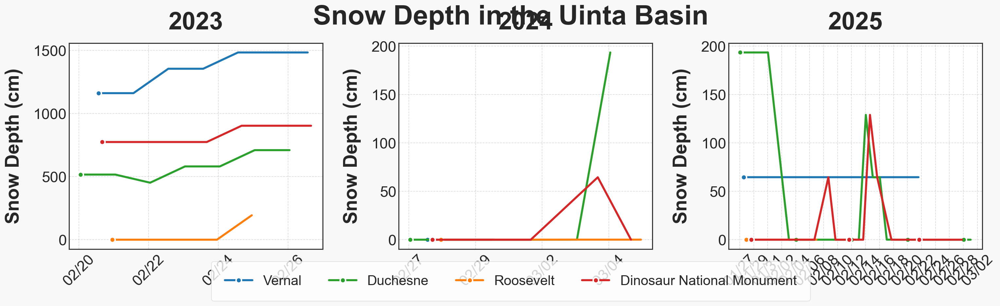

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 3 stations (0.19 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.22 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.33 seconds).


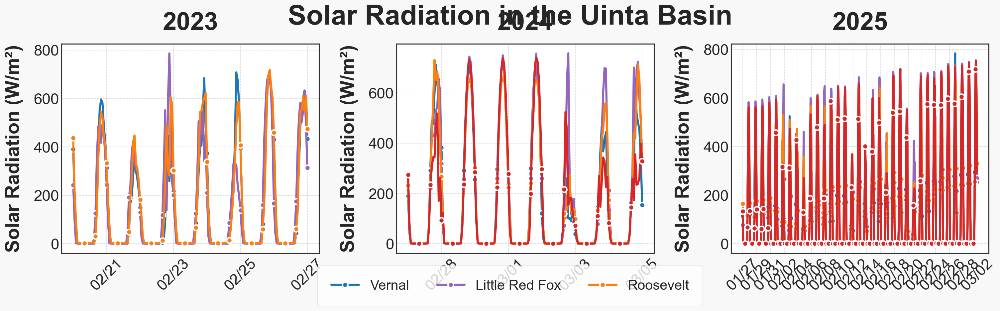

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.19 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.18 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.28 seconds).


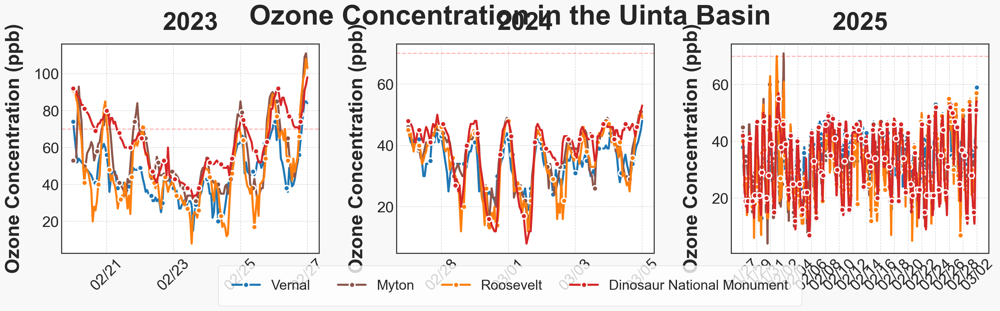

In [15]:
from datetime import datetime
from synoptic import TimeSeries
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.dates as mdates

# --- Styling ---
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Helvetica Neue', 'Helvetica', 'Arial']
rcParams['font.size'] = 22
rcParams['axes.titlesize'] = 36
rcParams['axes.labelsize'] = 28
rcParams['xtick.labelsize'] = 22
rcParams['ytick.labelsize'] = 22
rcParams['legend.fontsize'] = 20
rcParams['axes.linewidth'] = 1.5
rcParams['axes.edgecolor'] = '#333333'
plt.style.use('seaborn-v0_8-white')

# --- API Token ---
token = 'YOUR_API_TOKEN'

# --- Case Studies ---
case_studies = [
    {'year': '2023', 'start': datetime(2023, 2, 20), 'end': datetime(2023, 2, 27)},
    {'year': '2024', 'start': datetime(2024, 2, 27), 'end': datetime(2024, 3, 5)},
    {'year': '2025', 'start': datetime(2025, 1, 27), 'end': datetime(2025, 3, 2)}
]

# --- Variable Details ---
variables = {
    'snow_depth': {
        'title': 'Snow Depth',
        'ylabel': 'Snow Depth (cm)',  # converted to centimeters
        'stations': {
            'COOPVELU1': {'name': 'Vernal', 'color': '#1F77B4'},
            'COOPDSNU1': {'name': 'Duchesne', 'color': '#2CA02C'},
            'COOPROSU1': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'COOPDINU1': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    },
    'solar_radiation': {
        'title': 'Solar Radiation',
        'ylabel': 'Solar Radiation (W/m²)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'LRFU1': {'name': 'Little Red Fox', 'color': '#9467BD'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    },
    'ozone_concentration': {
        'title': 'Ozone Concentration',
        'ylabel': 'Ozone Concentration (ppb)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'A1388': {'name': 'Myton', 'color': '#8C564B'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    }
}

# Define the order in which the variables should appear
variable_keys = ['snow_depth', 'solar_radiation', 'ozone_concentration']

# Loop through each variable to create a separate 1x3 plot
for var_key in variable_keys:
    var_info = variables[var_key]

    # Create a figure with 1 row and 3 columns (one subplot per case study)
    fig, axes = plt.subplots(1, 3, figsize=(24, 6), dpi=150)
    fig.patch.set_facecolor('#F8F8F8')

    # Loop through the case studies and plot data on each subplot
    for idx, case in enumerate(case_studies):
        ax = axes[idx]
        start_date = case['start']
        end_date = case['end']
        year = case['year']
        stations = var_info['stations']

        # Get data from Synoptic's TimeSeries service
        ts = TimeSeries(
            token=token,
            stid=list(stations.keys()),
            vars=[var_key],
            start=start_date,
            end=end_date
        )
        df = ts.df()

        # Plot each station's data
        for stid, info in stations.items():
            station_data = df.filter((pl.col('stid') == stid) & (pl.col('variable') == var_key))
            station_data = station_data.filter(pl.col('value').is_not_null())
            if len(station_data) > 0:
                dates = station_data['date_time'].to_list()
                values = station_data['value'].to_list()
                # Convert snow depth from inches to centimeters
                if var_key == 'snow_depth':
                    values = [v * 2.54 for v in values]

                ax.plot(
                    dates,
                    values,
                    '-o',
                    label=info['name'],
                    color=info['color'],
                    linewidth=3,
                    markersize=8,
                    markeredgecolor='white',
                    markeredgewidth=2,
                    markevery=8
                )

        # For ozone, add the EPA reference line at 70 ppb
        if var_key == 'ozone_concentration':
            ax.axhline(y=70, color='#FF0000', linestyle='--', alpha=0.3, linewidth=1.5)

        # Format the x-axis to show dates
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
        ax.xaxis.set_major_locator(mdates.DayLocator(interval=2))
        ax.tick_params(axis='x', rotation=45, pad=5)
        ax.grid(True, linestyle='--', alpha=0.3, color='gray', which='major')
        ax.set_facecolor('white')
        ax.set_axisbelow(True)

        # Set subplot title and y-axis label
        ax.set_title(year, pad=20, fontweight='bold')
        ax.set_ylabel(var_info['ylabel'], labelpad=15, fontweight='bold')

        # Clean up spines
        for spine in ax.spines.values():
            spine.set_linewidth(1.5)
            spine.set_color('#333333')

    # Create a single legend for the figure (using handles from the first subplot)
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', ncol=len(handles),
               bbox_to_anchor=(0.5, -0.05), frameon=True, facecolor='white',
               edgecolor='#DDDDDD', borderpad=1)

    # Overall figure title
    fig.suptitle(f"{var_info['title']} in the Uinta Basin", fontsize=40,
                 fontweight='bold', y=0.98)

    plt.subplots_adjust(top=0.85, bottom=0.15, wspace=0.3)
    plt.show()


🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.21 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.20 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.22 seconds).


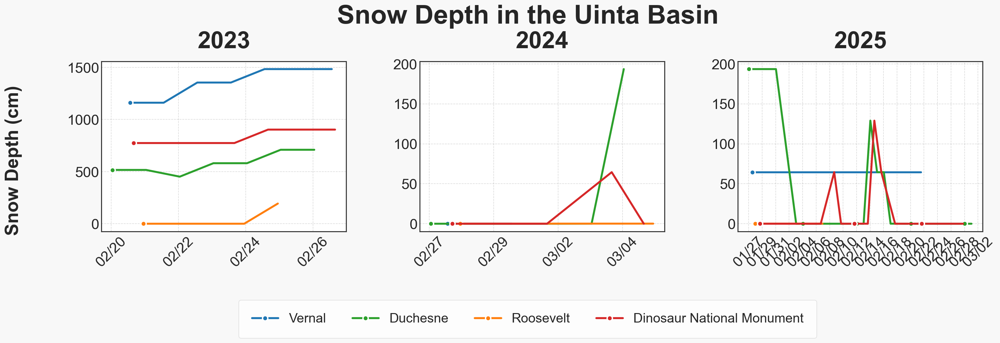

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 3 stations (0.21 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.21 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.26 seconds).


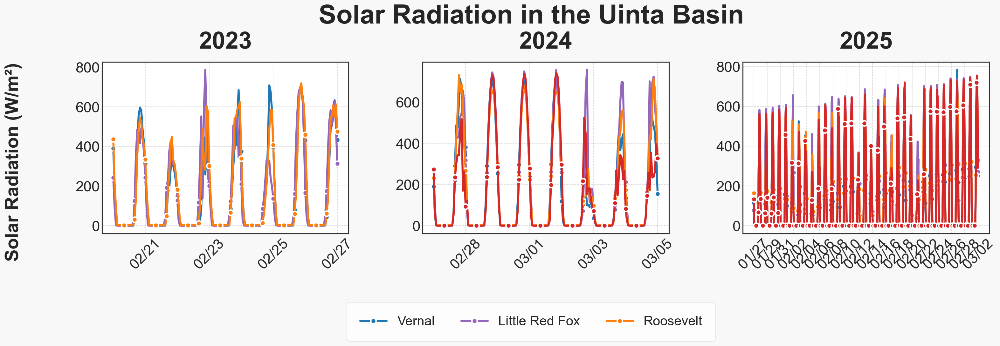

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.21 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.23 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.26 seconds).


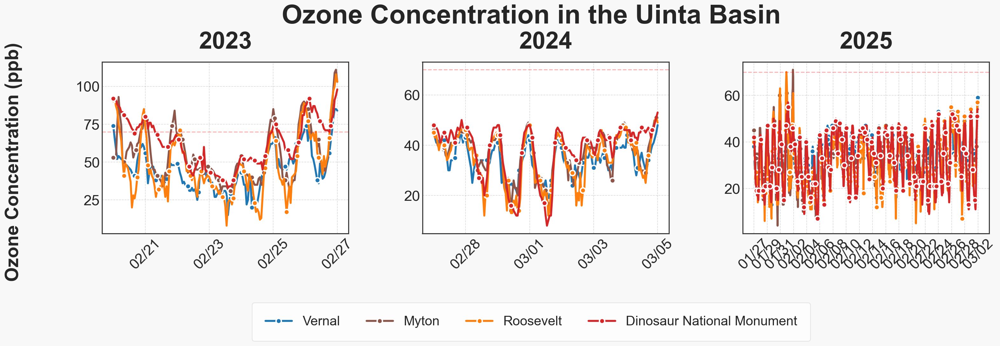

In [16]:
from datetime import datetime
from synoptic import TimeSeries
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.dates as mdates

# --- Styling ---
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Helvetica Neue', 'Helvetica', 'Arial']
rcParams['font.size'] = 22
rcParams['axes.titlesize'] = 36
rcParams['axes.labelsize'] = 28
rcParams['xtick.labelsize'] = 22
rcParams['ytick.labelsize'] = 22
rcParams['legend.fontsize'] = 20
rcParams['axes.linewidth'] = 1.5
rcParams['axes.edgecolor'] = '#333333'
plt.style.use('seaborn-v0_8-white')

# --- API Token ---
token = 'YOUR_API_TOKEN'

# --- Case Studies ---
case_studies = [
    {'year': '2023', 'start': datetime(2023, 2, 20), 'end': datetime(2023, 2, 27)},
    {'year': '2024', 'start': datetime(2024, 2, 27), 'end': datetime(2024, 3, 5)},
    {'year': '2025', 'start': datetime(2025, 1, 27), 'end': datetime(2025, 3, 2)}
]

# --- Variable Details ---
variables = {
    'snow_depth': {
        'title': 'Snow Depth',
        'ylabel': 'Snow Depth (cm)',  # converted to centimeters
        'stations': {
            'COOPVELU1': {'name': 'Vernal', 'color': '#1F77B4'},
            'COOPDSNU1': {'name': 'Duchesne', 'color': '#2CA02C'},
            'COOPROSU1': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'COOPDINU1': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    },
    'solar_radiation': {
        'title': 'Solar Radiation',
        'ylabel': 'Solar Radiation (W/m²)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'LRFU1': {'name': 'Little Red Fox', 'color': '#9467BD'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    },
    'ozone_concentration': {
        'title': 'Ozone Concentration',
        'ylabel': 'Ozone Concentration (ppb)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'A1388': {'name': 'Myton', 'color': '#8C564B'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    }
}

variable_keys = ['snow_depth', 'solar_radiation', 'ozone_concentration']

# Create a separate 1x3 figure for each variable.
for var_key in variable_keys:
    var_info = variables[var_key]

    # Create a 1 row x 3 columns layout: one subplot per case study.
    fig, axes = plt.subplots(1, 3, figsize=(24, 6), dpi=150)
    fig.patch.set_facecolor('#F8F8F8')

    for idx, case in enumerate(case_studies):
        ax = axes[idx]
        start_date = case['start']
        end_date = case['end']
        year = case['year']
        stations = var_info['stations']

        # Fetch data from Synoptic.
        ts = TimeSeries(
            token=token,
            stid=list(stations.keys()),
            vars=[var_key],
            start=start_date,
            end=end_date
        )
        df = ts.df()

        # Plot each station's data.
        for stid, info in stations.items():
            station_data = df.filter((pl.col('stid') == stid) & (pl.col('variable') == var_key))
            station_data = station_data.filter(pl.col('value').is_not_null())
            if len(station_data) > 0:
                dates = station_data['date_time'].to_list()
                values = station_data['value'].to_list()
                if var_key == 'snow_depth':
                    values = [v * 2.54 for v in values]
                ax.plot(
                    dates,
                    values,
                    '-o',
                    label=info['name'],
                    color=info['color'],
                    linewidth=3,
                    markersize=8,
                    markeredgecolor='white',
                    markeredgewidth=2,
                    markevery=8
                )

        # For ozone, add an EPA reference line.
        if var_key == 'ozone_concentration':
            ax.axhline(y=70, color='#FF0000', linestyle='--', alpha=0.3, linewidth=1.5)

        # Format the x-axis.
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
        ax.xaxis.set_major_locator(mdates.DayLocator(interval=2))
        ax.tick_params(axis='x', rotation=45, pad=5)
        ax.grid(True, linestyle='--', alpha=0.3, color='gray', which='major')
        ax.set_facecolor('white')
        ax.set_axisbelow(True)

        # Set the subplot title to show the case study year.
        ax.set_title(year, pad=20, fontweight='bold')

        # Remove individual y-axis labels; we'll add a common one later.
        ax.set_ylabel('')

        # Clean up spines.
        for spine in ax.spines.values():
            spine.set_linewidth(1.5)
            spine.set_color('#333333')

    # Add one common y-axis label to the left of the subplots.
    fig.text(0.04, 0.5, var_info['ylabel'], va='center', rotation='vertical',
             fontsize=28, fontweight='bold')

    # Create a single legend for the figure.
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', ncol=len(handles),
               bbox_to_anchor=(0.5, -0.15), frameon=True, facecolor='white',
               edgecolor='#DDDDDD', borderpad=1)

    # Overall figure title placed higher.
    fig.suptitle(f"{var_info['title']} in the Uinta Basin", fontsize=40,
                 fontweight='bold', y=1.05)

    # Adjust layout so the title and legend don't overlap the subplots.
    plt.subplots_adjust(top=0.85, bottom=0.25, wspace=0.3)
    plt.show()


🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.18 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.19 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.21 seconds).


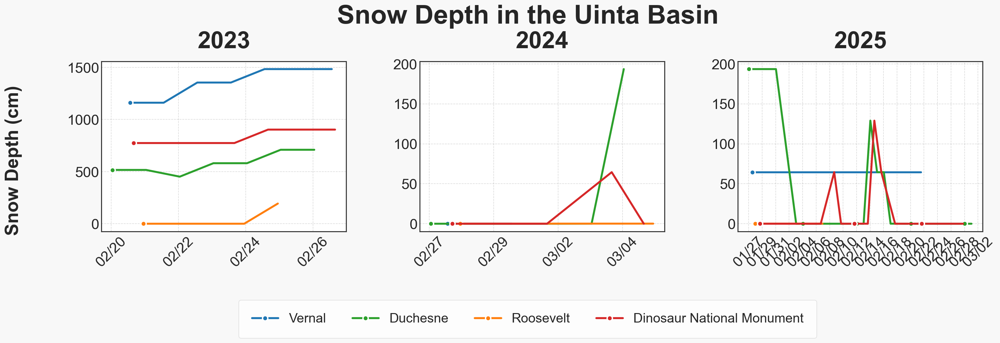

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 3 stations (0.20 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.21 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.23 seconds).


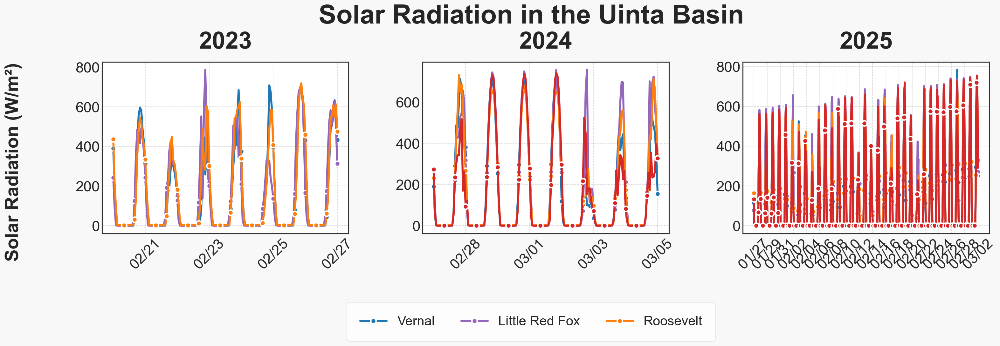

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.21 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.18 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.23 seconds).


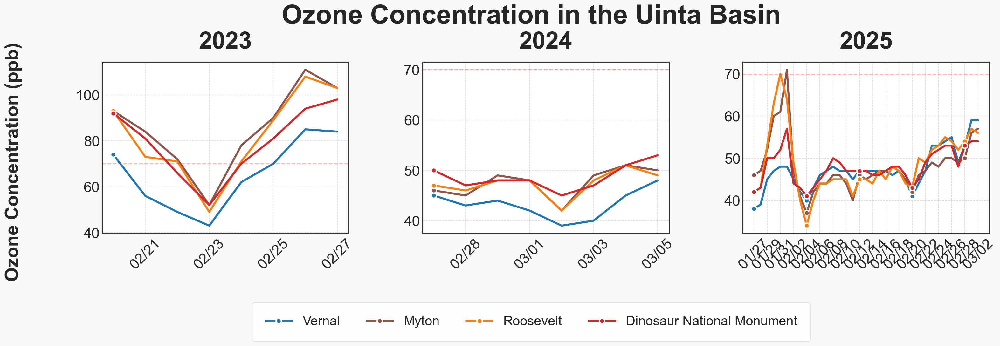

In [19]:
from datetime import datetime
from synoptic import TimeSeries
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.dates as mdates

# --- Styling ---
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Helvetica Neue', 'Helvetica', 'Arial']
rcParams['font.size'] = 22
rcParams['axes.titlesize'] = 36
rcParams['axes.labelsize'] = 28
rcParams['xtick.labelsize'] = 22
rcParams['ytick.labelsize'] = 22
rcParams['legend.fontsize'] = 20
rcParams['axes.linewidth'] = 1.5
rcParams['axes.edgecolor'] = '#333333'
plt.style.use('seaborn-v0_8-white')

# --- API Token ---
token = 'YOUR_API_TOKEN'

# --- Case Studies ---
case_studies = [
    {'year': '2023', 'start': datetime(2023, 2, 20), 'end': datetime(2023, 2, 27)},
    {'year': '2024', 'start': datetime(2024, 2, 27), 'end': datetime(2024, 3, 5)},
    {'year': '2025', 'start': datetime(2025, 1, 27), 'end': datetime(2025, 3, 2)}
]

# --- Variable Details ---
variables = {
    'snow_depth': {
        'title': 'Snow Depth',
        'ylabel': 'Snow Depth (cm)',  # converted to centimeters
        'stations': {
            'COOPVELU1': {'name': 'Vernal', 'color': '#1F77B4'},
            'COOPDSNU1': {'name': 'Duchesne', 'color': '#2CA02C'},
            'COOPROSU1': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'COOPDINU1': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    },
    'solar_radiation': {
        'title': 'Solar Radiation',
        'ylabel': 'Solar Radiation (W/m²)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'LRFU1': {'name': 'Little Red Fox', 'color': '#9467BD'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    },
    'ozone_concentration': {
        'title': 'Ozone Concentration',
        'ylabel': 'Ozone Concentration (ppb)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'A1388': {'name': 'Myton', 'color': '#8C564B'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur National Monument', 'color': '#D62728'}
        }
    }
}

variable_keys = ['snow_depth', 'solar_radiation', 'ozone_concentration']

# Create a separate 1x3 figure for each variable.
for var_key in variable_keys:
    var_info = variables[var_key]

    # Create a 1 row x 3 columns layout: one subplot per case study.
    fig, axes = plt.subplots(1, 3, figsize=(24, 6), dpi=150)
    fig.patch.set_facecolor('#F8F8F8')

    for idx, case in enumerate(case_studies):
        ax = axes[idx]
        start_date = case['start']
        end_date = case['end']
        year = case['year']
        stations = var_info['stations']

        # Fetch data for the current variable & date range.
        ts = TimeSeries(
            token=token,
            stid=list(stations.keys()),
            vars=[var_key],
            start=start_date,
            end=end_date
        )
        df = ts.df()

        for stid, info in stations.items():
            # Filter for the station and variable.
            station_data = df.filter((pl.col('stid') == stid) & (pl.col('variable') == var_key))
            station_data = station_data.filter(pl.col('value').is_not_null())
            if len(station_data) > 0:
                # For ozone, reduce data to one (daytime max) value per day.
                if var_key == 'ozone_concentration':
                    # Get lists of timestamps and values.
                    dates_list = station_data["date_time"].to_list()
                    values_list = station_data["value"].to_list()
                    # Use a Python dict to store the maximum value per day.
                    day_max = {}
                    for dt, val in zip(dates_list, values_list):
                        day = dt.date()  # get the date portion
                        if day in day_max:
                            day_max[day] = max(day_max[day], val)
                        else:
                            day_max[day] = val
                    sorted_days = sorted(day_max.keys())
                    dates = sorted_days
                    values = [day_max[d] for d in sorted_days]
                else:
                    dates = station_data["date_time"].to_list()
                    values = station_data["value"].to_list()
                    if var_key == 'snow_depth':
                        # Convert inches to centimeters.
                        values = [v * 2.54 for v in values]

                ax.plot(
                    dates,
                    values,
                    '-o',
                    label=info['name'],
                    color=info['color'],
                    linewidth=3,
                    markersize=8,
                    markeredgecolor='white',
                    markeredgewidth=2,
                    markevery=8
                )

        # For ozone, add an EPA reference line.
        if var_key == 'ozone_concentration':
            ax.axhline(y=70, color='#FF0000', linestyle='--', alpha=0.3, linewidth=1.5)

        # Format the x-axis.
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
        ax.xaxis.set_major_locator(mdates.DayLocator(interval=2))
        ax.tick_params(axis='x', rotation=45, pad=5)
        ax.grid(True, linestyle='--', alpha=0.3, color='gray', which='major')
        ax.set_facecolor('white')
        ax.set_axisbelow(True)

        # Set subplot title.
        ax.set_title(year, pad=20, fontweight='bold')
        # Remove individual y-axis labels.
        ax.set_ylabel('')

        # Clean up spines.
        for spine in ax.spines.values():
            spine.set_linewidth(1.5)
            spine.set_color('#333333')

    # Add one common y-axis label on the left.
    fig.text(0.04, 0.5, var_info['ylabel'], va='center', rotation='vertical',
             fontsize=28, fontweight='bold')

    # Create a single legend for the figure.
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', ncol=len(handles),
               bbox_to_anchor=(0.5, -0.15), frameon=True, facecolor='white',
               edgecolor='#DDDDDD', borderpad=1)

    # Place the overall figure title higher.
    fig.suptitle(f"{var_info['title']} in the Uinta Basin", fontsize=40,
                 fontweight='bold', y=1.05)

    # Adjust layout so the title and legend don't overlap the subplots.
    plt.subplots_adjust(top=0.85, bottom=0.25, wspace=0.3)
    plt.show()


🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.23 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 3 stations (0.75 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.70 seconds).


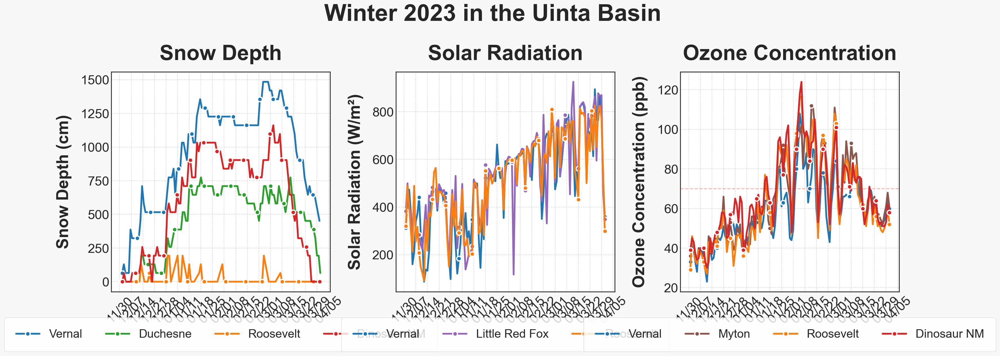

In [20]:
from datetime import datetime
from synoptic import TimeSeries
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.dates as mdates

# --- Styling ---
rcParams['font.family'] = 'sans-serif'
rcParams['font.size'] = 22
rcParams['axes.titlesize'] = 36
rcParams['axes.labelsize'] = 28
rcParams['xtick.labelsize'] = 22
rcParams['ytick.labelsize'] = 22
rcParams['legend.fontsize'] = 20
rcParams['axes.linewidth'] = 1.5
plt.style.use('seaborn-v0_8-white')

# --- API Token ---
token = 'YOUR_API_TOKEN'

# --- Timeline: Winter of 2023 ---
# (Assuming winter 2023 spans Dec 1, 2022 to Mar 31, 2023)
start_date = datetime(2022, 12, 1)
end_date   = datetime(2023, 3, 31)

# --- Variable Details ---
variables = {
    'snow_depth': {
        'title': 'Snow Depth',
        'ylabel': 'Snow Depth (cm)',  # convert inches to cm
        'stations': {
            'COOPVELU1': {'name': 'Vernal', 'color': '#1F77B4'},
            'COOPDSNU1': {'name': 'Duchesne', 'color': '#2CA02C'},
            'COOPROSU1': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'COOPDINU1': {'name': 'Dinosaur NM', 'color': '#D62728'}
        }
    },
    'solar_radiation': {
        'title': 'Solar Radiation',
        'ylabel': 'Solar Radiation (W/m²)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'LRFU1': {'name': 'Little Red Fox', 'color': '#9467BD'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur NM', 'color': '#D62728'}
        }
    },
    'ozone_concentration': {
        'title': 'Ozone Concentration',
        'ylabel': 'Ozone Concentration (ppb)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'A1388': {'name': 'Myton', 'color': '#8C564B'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur NM', 'color': '#D62728'}
        }
    }
}

variable_keys = ['snow_depth', 'solar_radiation', 'ozone_concentration']

# --- Create a single figure with 1 row x 3 columns (one subplot per variable) ---
fig, axes = plt.subplots(1, 3, figsize=(24, 8), dpi=150)
fig.patch.set_facecolor('#F8F8F8')

for i, var_key in enumerate(variable_keys):
    ax = axes[i]
    var_info = variables[var_key]
    stations = var_info['stations']

    # Fetch data for all stations for the current variable.
    ts = TimeSeries(
        token=token,
        stid=list(stations.keys()),
        vars=[var_key],
        start=start_date,
        end=end_date
    )
    df = ts.df()

    for stid, info in stations.items():
        station_data = df.filter((pl.col('stid') == stid) & (pl.col('variable') == var_key))
        station_data = station_data.filter(pl.col('value').is_not_null())
        if len(station_data) == 0:
            continue

        # For ozone and solar, reduce to daily max values.
        if var_key in ['ozone_concentration', 'solar_radiation']:
            dates_list = station_data["date_time"].to_list()
            values_list = station_data["value"].to_list()
            day_max = {}
            for dt, val in zip(dates_list, values_list):
                day = dt.date()  # extract the date portion
                day_max[day] = max(day_max.get(day, val), val)
            sorted_days = sorted(day_max.keys())
            dates = sorted_days
            values = [day_max[d] for d in sorted_days]
        else:
            dates = station_data["date_time"].to_list()
            values = station_data["value"].to_list()
            # Convert snow depth from inches to centimeters.
            if var_key == 'snow_depth':
                values = [v * 2.54 for v in values]

        ax.plot(
            dates,
            values,
            '-o',
            label=info['name'],
            color=info['color'],
            linewidth=3,
            markersize=8,
            markeredgecolor='white',
            markeredgewidth=2,
            markevery=8
        )

    # For ozone, add an EPA reference line at 70 ppb.
    if var_key == 'ozone_concentration':
        ax.axhline(y=70, color='#FF0000', linestyle='--', alpha=0.3, linewidth=1.5)

    ax.set_title(var_info['title'], pad=20, fontweight='bold')
    ax.set_ylabel(var_info['ylabel'], labelpad=15, fontweight='bold')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
    ax.tick_params(axis='x', rotation=45, pad=5)
    ax.grid(True, linestyle='--', alpha=0.3, color='gray', which='major')
    ax.set_facecolor('white')
    ax.set_axisbelow(True)
    # Place a legend below each subplot.
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=len(handles),
              frameon=True, facecolor='white', edgecolor='#DDDDDD', borderpad=1)
    # Clean up spines.
    for spine in ax.spines.values():
        spine.set_linewidth(1.5)
        spine.set_color('#333333')

fig.suptitle("Winter 2023 in the Uinta Basin", fontsize=40, fontweight='bold', y=1.05)
plt.subplots_adjust(top=0.85, bottom=0.2, wspace=0.3)
plt.show()

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.21 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 3 stations (0.45 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.71 seconds).


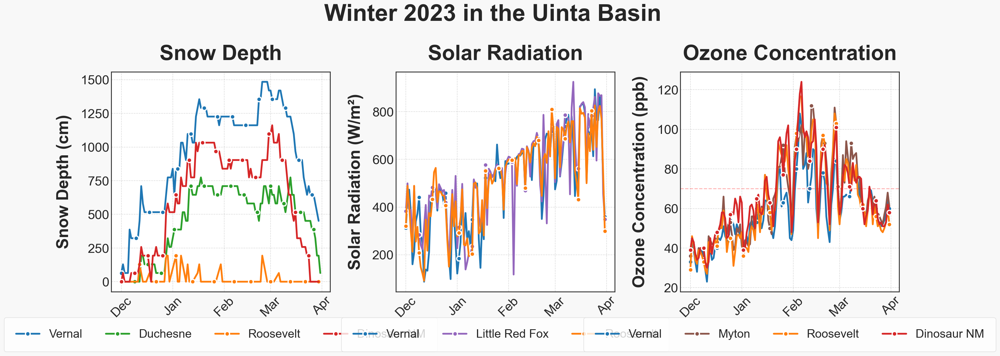

In [21]:
from datetime import datetime
from synoptic import TimeSeries
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.dates as mdates

# --- Styling ---
rcParams['font.family'] = 'sans-serif'
rcParams['font.size'] = 22
rcParams['axes.titlesize'] = 36
rcParams['axes.labelsize'] = 28
rcParams['xtick.labelsize'] = 22
rcParams['ytick.labelsize'] = 22
rcParams['legend.fontsize'] = 20
rcParams['axes.linewidth'] = 1.5
plt.style.use('seaborn-v0_8-white')

# --- API Token ---
token = 'YOUR_API_TOKEN'

# --- Timeline: Winter 2023 ---
# Winter 2023 defined as Dec 1, 2022 – Mar 31, 2023.
start_date = datetime(2022, 12, 1)
end_date   = datetime(2023, 3, 31)

# --- Variable Details ---
variables = {
    'snow_depth': {
        'title': 'Snow Depth',
        'ylabel': 'Snow Depth (cm)',  # will convert from inches to cm
        'stations': {
            'COOPVELU1': {'name': 'Vernal', 'color': '#1F77B4'},
            'COOPDSNU1': {'name': 'Duchesne', 'color': '#2CA02C'},
            'COOPROSU1': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'COOPDINU1': {'name': 'Dinosaur NM', 'color': '#D62728'}
        }
    },
    'solar_radiation': {
        'title': 'Solar Radiation',
        'ylabel': 'Solar Radiation (W/m²)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'LRFU1': {'name': 'Little Red Fox', 'color': '#9467BD'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur NM', 'color': '#D62728'}
        }
    },
    'ozone_concentration': {
        'title': 'Ozone Concentration',
        'ylabel': 'Ozone Concentration (ppb)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'A1388': {'name': 'Myton', 'color': '#8C564B'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur NM', 'color': '#D62728'}
        }
    }
}

variable_keys = ['snow_depth', 'solar_radiation', 'ozone_concentration']

# --- Create a single figure with 1 row x 3 columns (one subplot per variable) ---
fig, axes = plt.subplots(1, 3, figsize=(24, 8), dpi=150)
fig.patch.set_facecolor('#F8F8F8')

for i, var_key in enumerate(variable_keys):
    ax = axes[i]
    var_info = variables[var_key]
    stations = var_info['stations']

    # Fetch data for all stations for the current variable.
    ts = TimeSeries(
        token=token,
        stid=list(stations.keys()),
        vars=[var_key],
        start=start_date,
        end=end_date
    )
    df = ts.df()

    for stid, info in stations.items():
        station_data = df.filter((pl.col('stid') == stid) & (pl.col('variable') == var_key))
        station_data = station_data.filter(pl.col('value').is_not_null())
        if len(station_data) == 0:
            continue

        # Aggregate data to daily maximum.
        dates_list = station_data["date_time"].to_list()
        values_list = station_data["value"].to_list()
        day_max = {}
        for dt, val in zip(dates_list, values_list):
            day = dt.date()  # group by day
            day_max[day] = max(day_max.get(day, val), val)
        sorted_days = sorted(day_max.keys())
        dates = sorted_days
        values = [day_max[d] for d in sorted_days]

        # For snow depth, convert from inches to centimeters.
        if var_key == 'snow_depth':
            values = [v * 2.54 for v in values]

        ax.plot(
            dates,
            values,
            '-o',
            label=info['name'],
            color=info['color'],
            linewidth=3,
            markersize=8,
            markeredgecolor='white',
            markeredgewidth=2,
            markevery=8
        )

    # For ozone, add an EPA reference line at 70 ppb.
    if var_key == 'ozone_concentration':
        ax.axhline(y=70, color='#FF0000', linestyle='--', alpha=0.3, linewidth=1.5)

    ax.set_title(var_info['title'], pad=20, fontweight='bold')
    ax.set_ylabel(var_info['ylabel'], labelpad=15, fontweight='bold')
    # Set the x-axis to display only the month.
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.tick_params(axis='x', rotation=45, pad=5)
    ax.grid(True, linestyle='--', alpha=0.3, color='gray', which='major')
    ax.set_facecolor('white')
    ax.set_axisbelow(True)

    # Place a legend below each subplot.
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=len(handles),
              frameon=True, facecolor='white', edgecolor='#DDDDDD', borderpad=1)

    # Clean up spines.
    for spine in ax.spines.values():
        spine.set_linewidth(1.5)
        spine.set_color('#333333')

fig.suptitle("Winter 2023 in the Uinta Basin", fontsize=40, fontweight='bold', y=1.05)
plt.subplots_adjust(top=0.85, bottom=0.2, wspace=0.3)
plt.show()


🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.22 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 3 stations (0.52 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.50 seconds).


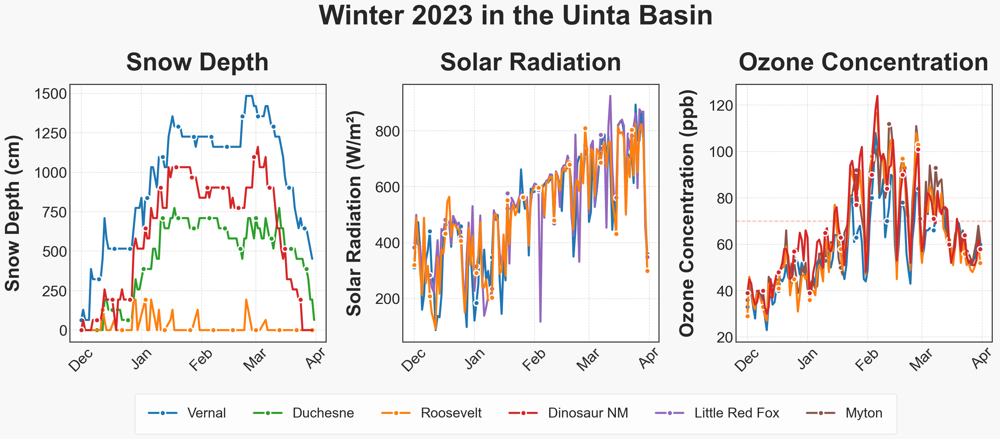

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.21 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.77 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (2.49 seconds).


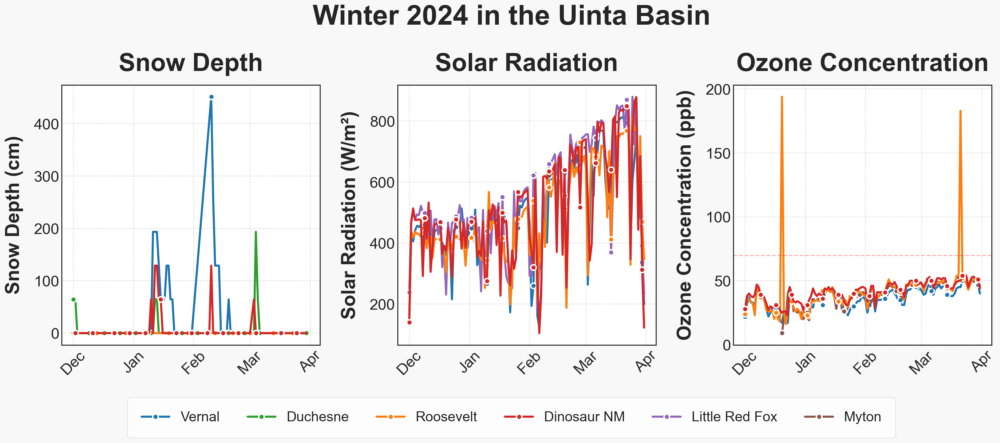

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.23 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.61 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 4 stations (0.59 seconds).


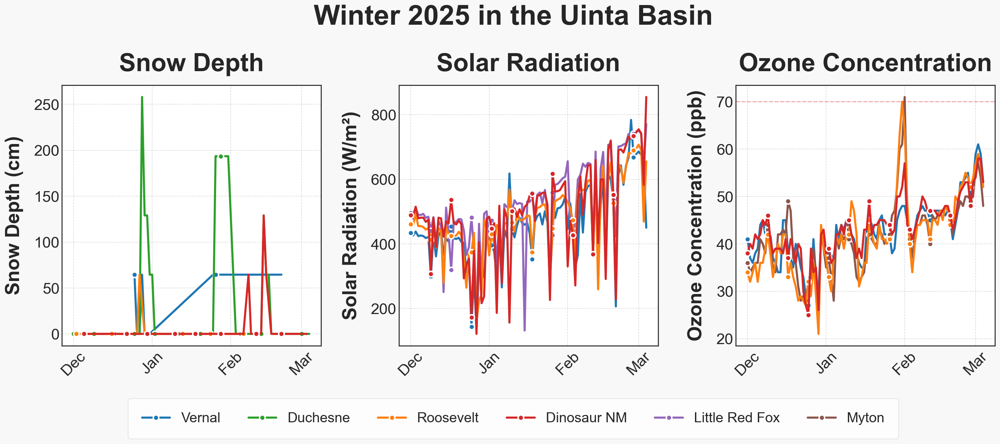

In [22]:
from datetime import datetime
from synoptic import TimeSeries
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import rcParams, lines
import matplotlib.dates as mdates

# --- Styling ---
rcParams['font.family'] = 'sans-serif'
rcParams['font.size'] = 22
rcParams['axes.titlesize'] = 36
rcParams['axes.labelsize'] = 28
rcParams['xtick.labelsize'] = 22
rcParams['ytick.labelsize'] = 22
rcParams['legend.fontsize'] = 20
rcParams['axes.linewidth'] = 1.5
plt.style.use('seaborn-v0_8-white')

# --- API Token ---
token = 'YOUR_API_TOKEN'

# --- Define Winter Periods ---
# "Winter" is defined as Dec 1 to Mar 31.
winter_periods = {
    "2023": {"start": datetime(2022, 12, 1), "end": datetime(2023, 3, 31)},
    "2024": {"start": datetime(2023, 12, 1), "end": datetime(2024, 3, 31)},
    "2025": {"start": datetime(2024, 12, 1), "end": datetime(2025, 3, 31)}
}

# --- Variable Details ---
variables = {
    'snow_depth': {
        'title': 'Snow Depth',
        'ylabel': 'Snow Depth (cm)',  # converting inches to cm after aggregation
        'stations': {
            'COOPVELU1': {'name': 'Vernal', 'color': '#1F77B4'},
            'COOPDSNU1': {'name': 'Duchesne', 'color': '#2CA02C'},
            'COOPROSU1': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'COOPDINU1': {'name': 'Dinosaur NM', 'color': '#D62728'}
        }
    },
    'solar_radiation': {
        'title': 'Solar Radiation',
        'ylabel': 'Solar Radiation (W/m²)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'LRFU1': {'name': 'Little Red Fox', 'color': '#9467BD'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur NM', 'color': '#D62728'}
        }
    },
    'ozone_concentration': {
        'title': 'Ozone Concentration',
        'ylabel': 'Ozone Concentration (ppb)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'A1388': {'name': 'Myton', 'color': '#8C564B'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur NM', 'color': '#D62728'}
        }
    }
}
variable_keys = ['snow_depth', 'solar_radiation', 'ozone_concentration']

# --- Unified Legend Dictionary ---
# Union of station names across variables.
legend_dict = {
    'Vernal': '#1F77B4',
    'Duchesne': '#2CA02C',
    'Roosevelt': '#FF7F0E',
    'Dinosaur NM': '#D62728',
    'Little Red Fox': '#9467BD',
    'Myton': '#8C564B'
}

# --- Loop Over Each Winter Period ---
for year_label, period in winter_periods.items():
    start_date = period["start"]
    end_date = period["end"]

    # Create figure with 1 row x 3 columns (one subplot per variable)
    fig, axes = plt.subplots(1, 3, figsize=(24, 8), dpi=150)
    fig.patch.set_facecolor('#F8F8F8')

    for i, var_key in enumerate(variable_keys):
        ax = axes[i]
        var_info = variables[var_key]
        stations = var_info['stations']

        # Fetch data for all stations for the current variable and period.
        ts = TimeSeries(
            token=token,
            stid=list(stations.keys()),
            vars=[var_key],
            start=start_date,
            end=end_date
        )
        df = ts.df()

        for stid, info in stations.items():
            station_data = df.filter((pl.col('stid') == stid) & (pl.col('variable') == var_key))
            station_data = station_data.filter(pl.col('value').is_not_null())
            if len(station_data) == 0:
                continue

            # Aggregate to daily maximum.
            dates_list = station_data["date_time"].to_list()
            values_list = station_data["value"].to_list()
            day_max = {}
            for dt, val in zip(dates_list, values_list):
                day = dt.date()  # group by day
                day_max[day] = max(day_max.get(day, val), val)
            sorted_days = sorted(day_max.keys())
            dates = sorted_days
            values = [day_max[d] for d in sorted_days]

            # Convert snow depth to cm.
            if var_key == 'snow_depth':
                values = [v * 2.54 for v in values]

            ax.plot(
                dates,
                values,
                '-o',
                label=info['name'],  # individual station labels (will not be used in subplot legends)
                color=info['color'],
                linewidth=3,
                markersize=8,
                markeredgecolor='white',
                markeredgewidth=2,
                markevery=8
            )

        # For ozone, add an EPA reference line at 70 ppb.
        if var_key == 'ozone_concentration':
            ax.axhline(y=70, color='#FF0000', linestyle='--', alpha=0.3, linewidth=1.5)

        ax.set_title(var_info['title'], pad=20, fontweight='bold')
        ax.set_ylabel(var_info['ylabel'], labelpad=15, fontweight='bold')

        # Format the x-axis to display only the month.
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
        ax.xaxis.set_major_locator(mdates.MonthLocator())
        ax.tick_params(axis='x', rotation=45, pad=5)
        ax.grid(True, linestyle='--', alpha=0.3, color='gray', which='major')
        ax.set_facecolor('white')
        ax.set_axisbelow(True)

        # Clean up spines.
        for spine in ax.spines.values():
            spine.set_linewidth(1.5)
            spine.set_color('#333333')

    # Create a unified legend for the entire figure.
    handles = [lines.Line2D([], [], color=color, marker='o', markersize=8,
                             markeredgecolor='white', markeredgewidth=2, linewidth=3)
               for name, color in legend_dict.items()]
    labels = list(legend_dict.keys())
    fig.legend(handles, labels, loc='lower center', ncol=len(legend_dict),
               bbox_to_anchor=(0.5, -0.05), frameon=True, facecolor='white',
               edgecolor='#DDDDDD', borderpad=1)

    fig.suptitle(f"Winter {year_label} in the Uinta Basin", fontsize=40, fontweight='bold', y=1.05)
    plt.subplots_adjust(top=0.85, bottom=0.2, wspace=0.3)
    plt.show()


🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.20 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.29 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.20 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.38 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.20 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.29 seconds).


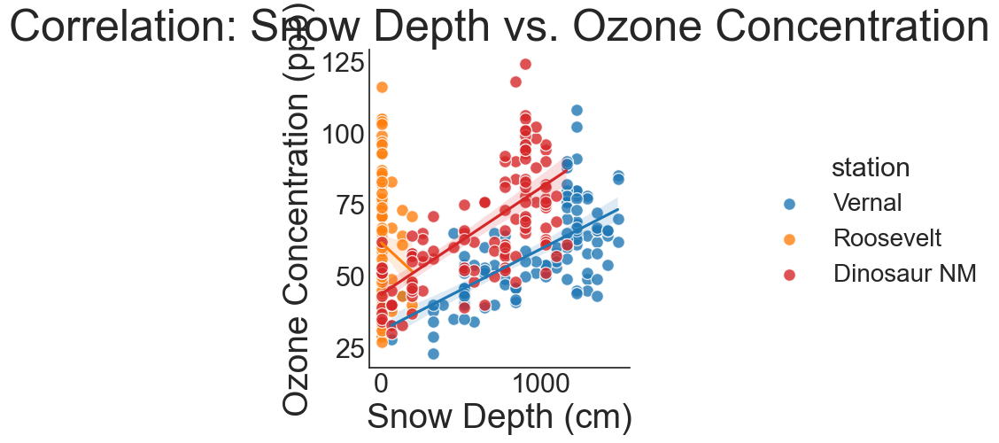

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.96 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.23 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.61 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (1.32 seconds).
Spatial Distribution Map saved as 'spatial_distribution_map.html'.

Highest Ozone Days by Station:
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.29 seconds).
  Vernal: 2023-02-05 with 108.0 ppb
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.28 seconds).
  Myton: 2023-02-12 with 112.0 ppb
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.29 seconds).
  Roosevelt: 2023-02-05 with 117.0 ppb
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data

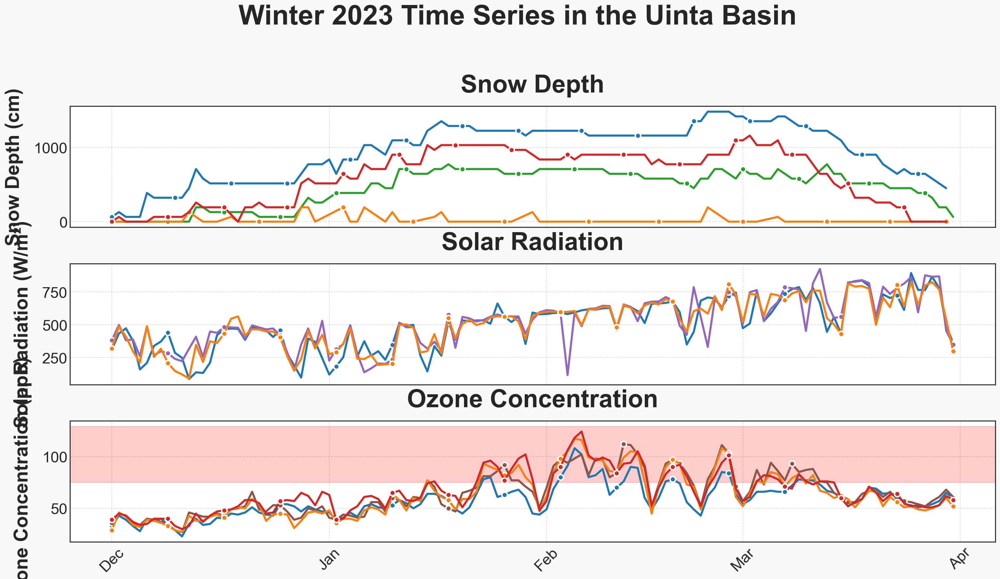

🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.26 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.26 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.26 seconds).
🚚💨 Speedy delivery from Synoptic's timeseries service.
📦 Received data from 1 stations (0.28 seconds).

Summary Statistics for Ozone (ppb):
       station  mean_ozone  median_ozone  std_ozone
0       Vernal   57.809917          55.0  15.843671
1        Myton   64.591667          61.0  20.327775
2    Roosevelt   62.743802          59.0  21.622338
3  Dinosaur NM   66.008264          62.0  19.910004


In [23]:
from datetime import datetime
from synoptic import TimeSeries
import polars as pl
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import matplotlib.dates as mdates
from matplotlib import rcParams, lines

# Styling
rcParams['font.family'] = 'sans-serif'
rcParams['font.size'] = 22
rcParams['axes.titlesize'] = 36
rcParams['axes.labelsize'] = 28
rcParams['xtick.labelsize'] = 22
rcParams['ytick.labelsize'] = 22
rcParams['legend.fontsize'] = 20
rcParams['axes.linewidth'] = 1.5
plt.style.use('seaborn-v0_8-white')

# API Token
token = 'YOUR_API_TOKEN'

# Winter 2023 Timeline
# Define winter 2023 as Dec 1, 2022 – Mar 31, 2023.
start_date = datetime(2022, 12, 1)
end_date   = datetime(2023, 3, 31)

# Station Mapping for Correlation Plot
# For the correlation plot we compare collocated stations:
station_mapping = {
    'Vernal': {'snow': 'COOPVELU1', 'ozone': 'QV4'},
    'Roosevelt': {'snow': 'COOPROSU1', 'ozone': 'QRS'},
    'Dinosaur NM': {'snow': 'COOPDINU1', 'ozone': 'A3822'}
}

# Variable Details
# Note: The solar radiation variable has been modified to remove station A3822.
variables = {
    'snow_depth': {
        'title': 'Snow Depth',
        'ylabel': 'Snow Depth (cm)',  # Convert inches to cm later
        'stations': {
            'COOPVELU1': {'name': 'Vernal', 'color': '#1F77B4'},
            'COOPDSNU1': {'name': 'Duchesne', 'color': '#2CA02C'},
            'COOPROSU1': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'COOPDINU1': {'name': 'Dinosaur NM', 'color': '#D62728'}
        }
    },
    'solar_radiation': {
        'title': 'Solar Radiation',
        'ylabel': 'Solar Radiation (W/m²)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'LRFU1': {'name': 'Little Red Fox', 'color': '#9467BD'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'}
            # Removed A3822 because your account isn’t returning solar data for it.
        }
    },
    'ozone_concentration': {
        'title': 'Ozone Concentration',
        'ylabel': 'Ozone Concentration (ppb)',
        'stations': {
            'QV4': {'name': 'Vernal', 'color': '#1F77B4'},
            'A1388': {'name': 'Myton', 'color': '#8C564B'},
            'QRS': {'name': 'Roosevelt', 'color': '#FF7F0E'},
            'A3822': {'name': 'Dinosaur NM', 'color': '#D62728'}
        }
    }
}

# Helper Function: Get Daily Maximum Values
def get_daily_max(token, stids, variable, start_date, end_date):
    """
    Fetch data for a given variable and list of station IDs over the specified dates,
    then aggregate each station’s data to daily maximum values.
    Returns a pandas DataFrame with columns: date, value, stid.
    """
    ts = TimeSeries(token=token, stid=stids, vars=[variable], start=start_date, end=end_date)
    df = ts.df()
    rows = []
    for stid in stids:
        station_data = df.filter((pl.col('stid') == stid) & (pl.col('variable') == variable))
        station_data = station_data.filter(pl.col('value').is_not_null())
        if len(station_data) == 0:
            continue
        dates_list = station_data["date_time"].to_list()
        values_list = station_data["value"].to_list()
        day_max = {}
        for dt, val in zip(dates_list, values_list):
            day = dt.date()  # group by day
            day_max[day] = max(day_max.get(day, val), val)
        for d, v in day_max.items():
            rows.append({"date": d, "value": v, "stid": stid})
    return pd.DataFrame(rows)

# CORRELATION PLOT: Snow Depth vs. Ozone Concentration

df_list = []
for station, codes in station_mapping.items():
    df_snow = get_daily_max(token, [codes['snow']], 'snow_depth', start_date, end_date)
    df_ozone = get_daily_max(token, [codes['ozone']], 'ozone_concentration', start_date, end_date)
    if df_snow.empty or df_ozone.empty:
        continue
    # Convert snow depth from inches to centimeters.
    df_snow['value'] = df_snow['value'] * 2.54
    df_merged = pd.merge(df_snow, df_ozone, on='date', suffixes=('_snow', '_ozone'))
    df_merged['station'] = station
    df_list.append(df_merged)
if df_list:
    df_corr = pd.concat(df_list, ignore_index=True)
    sns.lmplot(data=df_corr, x='value_snow', y='value_ozone', hue='station',
               markers='o', palette={'Vernal':'#1F77B4', 'Roosevelt':'#FF7F0E', 'Dinosaur NM':'#D62728'},
               scatter_kws={'s': 100, 'edgecolor': 'white'})
    plt.xlabel('Snow Depth (cm)')
    plt.ylabel('Ozone Concentration (ppb)')
    plt.title('Correlation: Snow Depth vs. Ozone Concentration')
    plt.show()

# SPATIAL DISTRIBUTION MAP: Average Ozone Levels

station_coords = {
    'Vernal': {'lat': 40.45, 'lon': -109.50},
    'Roosevelt': {'lat': 40.20, 'lon': -109.75},
    'Dinosaur NM': {'lat': 40.20, 'lon': -109.40},
    'Myton': {'lat': 40.35, 'lon': -109.90}
}
ozone_stations_mapping = {
    'Vernal': 'QV4',
    'Myton': 'A1388',
    'Roosevelt': 'QRS',
    'Dinosaur NM': 'A3822'
}
avg_ozone = {}
for station, code in ozone_stations_mapping.items():
    df_ozone = get_daily_max(token, [code], 'ozone_concentration', start_date, end_date)
    if not df_ozone.empty:
        avg_val = df_ozone['value'].mean()
        avg_ozone[station] = avg_val

basin_map = folium.Map(location=[40.3, -109.7], zoom_start=8)
for station, avg in avg_ozone.items():
    coords = station_coords.get(station, {'lat': 40.3, 'lon': -109.7})
    folium.CircleMarker(location=[coords['lat'], coords['lon']],
                        radius=8,
                        color='blue',
                        fill=True,
                        fill_color='blue',
                        popup=f"{station}: {avg:.1f} ppb").add_to(basin_map)
basin_map.save("spatial_distribution_map.html")
print("Spatial Distribution Map saved as 'spatial_distribution_map.html'.")

# EVENT ANALYSIS: Identify Highest Ozone Days

print("\nHighest Ozone Days by Station:")
for station, code in ozone_stations_mapping.items():
    df_ozone = get_daily_max(token, [code], 'ozone_concentration', start_date, end_date)
    if df_ozone.empty:
        continue
    max_idx = df_ozone['value'].idxmax()
    max_row = df_ozone.loc[max_idx]
    print(f"  {station}: {max_row['date']} with {max_row['value']:.1f} ppb")

# TIME SERIES VISUALIZATION: Shaded Exceedance Periods

fig, axes = plt.subplots(3, 1, figsize=(24, 12), dpi=150, sharex=True)
fig.patch.set_facecolor('#F8F8F8')
plot_vars = {
    'snow_depth': {'code_list': list(variables['snow_depth']['stations'].keys()), 'convert': lambda v: v*2.54},
    'solar_radiation': {'code_list': list(variables['solar_radiation']['stations'].keys()), 'convert': lambda v: v},
    'ozone_concentration': {'code_list': list(variables['ozone_concentration']['stations'].keys()), 'convert': lambda v: v}
}
for ax, var_key in zip(axes, ['snow_depth', 'solar_radiation', 'ozone_concentration']):
    var_info = variables[var_key]
    for stid, info in var_info['stations'].items():
        df_var = get_daily_max(token, [stid], var_key, start_date, end_date)
        if df_var.empty:
            continue
        # Apply conversion (e.g., snow depth inches to cm)
        if var_key == 'snow_depth':
            df_var['value'] = df_var['value'] * 2.54
        dates = pd.to_datetime(df_var['date'])
        values = df_var['value']
        ax.plot(dates, values, '-o', label=info['name'], color=info['color'],
                linewidth=3, markersize=8, markeredgecolor='white', markeredgewidth=2, markevery=8)
    if var_key == 'ozone_concentration':
        ylim = ax.get_ylim()
        ax.axhspan(75, ylim[1], color='red', alpha=0.2)
    ax.set_title(var_info['title'], pad=20, fontweight='bold')
    ax.set_ylabel(var_info['ylabel'], labelpad=15, fontweight='bold')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.tick_params(axis='x', rotation=45, pad=5)
    ax.grid(True, linestyle='--', alpha=0.3, color='gray', which='major')
    for spine in ax.spines.values():
        spine.set_linewidth(1.5)
        spine.set_color('#333333')
fig.suptitle("Winter 2023 Time Series in the Uinta Basin", fontsize=40, fontweight='bold', y=1.05)
plt.subplots_adjust(top=0.88, bottom=0.15, hspace=0.3)
plt.show()

# SUMMARY STATISTICS: Ozone Comparison Table

summary_rows = []
for station, code in ozone_stations_mapping.items():
    df_ozone = get_daily_max(token, [code], 'ozone_concentration', start_date, end_date)
    if df_ozone.empty:
        continue
    summary = {
        'station': station,
        'mean_ozone': df_ozone['value'].mean(),
        'median_ozone': df_ozone['value'].median(),
        'std_ozone': df_ozone['value'].std()
    }
    summary_rows.append(summary)
summary_table = pd.DataFrame(summary_rows)
print("\nSummary Statistics for Ozone (ppb):")
print(summary_table)
